### Libraries

In [1]:
import pandas as pd#data structures and operations for manipulating numerical tables and time series.
import pandas_datareader.data as data#Up-to-date remote data access for pandas.
import datetime as dt#supplies classes for manipulating dates and times
from datetime import timedelta
import matplotlib.pyplot as plt#plotting library for the Python.
import seaborn as sns;# visualizacion
import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings
import itertools
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.tsa.holtwinters import ExponentialSmoothing
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf 
from statsmodels.tsa.stattools import adfuller
import statsmodels.tsa.api as smtsa
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from statsmodels.tools.eval_measures import rmse
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error,  mean_squared_log_error, median_absolute_error
from statsmodels.tsa.ar_model import AR,ARResults# Load specific forecasting tools
from sklearn.preprocessing import StandardScaler
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima_model import ARMA,ARMAResults,ARIMA,ARIMAResults
from keras.models import Sequential
from keras.layers import Dense, LSTM, Dropout
from itertools import product
from math import sqrt
from fbprophet import Prophet
from fbprophet.plot import plot_plotly, plot_components_plotly
from fbprophet.diagnostics import performance_metrics
from fbprophet.diagnostics import cross_validation
import plotly.express as px
import plotly.graph_objects as go
import nbimporter
import Plots as Plo

In [2]:
#!pip install pandas-datareader
#!pip install seaborn
#!conda install -c plotly plotly
#!pip install pmdarima
#!conda install -c conda-forge fbprophet -y
#!pip install fbprophet
#!pip install pystan==2.17.1.0
#!pip install nbimporter

### Contents

### I.- Describe Data :

This is research about 2 companies of renewable energy in the stock market. The problematic here is a forecasting, that consists of predicting the values in the future of these companies, we are working with time series.


#### A.- EDP Renováveis (0ML1.IL)

In [3]:
# We define the ticket from the companies that we are interested in research.

ticker = ['0ML1.IL']#0ML1.IL london
                    
                    

# We would like all available data from 01-01-2016 until today
start_date = '2016-01-01'

today = dt.date.today()
yesterday = today - timedelta(days=1)
end_date = yesterday

# User pandas_reader.data.DataReader to load the desired data.
EDPR= data.DataReader('0ML1.IL', 'yahoo', start_date, end_date )
EDPR.head(7)

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2016-01-04,7.13510,7.1351,7.13510,7.13510,0.0,6.866566
2016-01-05,7.30060,7.3006,7.30060,7.30060,150.0,7.025838
2016-01-06,7.21513,7.1365,7.22580,7.21513,1331.0,6.943585
2016-01-07,7.23450,7.1250,7.17600,7.21950,11142.0,6.947790
2016-01-08,7.27900,7.1965,7.24165,7.19650,13085.0,6.925655
2016-01-11,7.15700,7.0110,7.15700,7.02300,3064.0,6.758686
2016-01-12,7.11700,7.1170,7.11700,7.11700,176.0,6.849148


In [4]:
EDPR.shape

(1610, 6)

In [5]:
EDPR.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1610 entries, 2016-01-04 to 2022-05-16
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   High       1610 non-null   float64
 1   Low        1610 non-null   float64
 2   Open       1610 non-null   float64
 3   Close      1610 non-null   float64
 4   Volume     1610 non-null   float64
 5   Adj Close  1610 non-null   float64
dtypes: float64(6)
memory usage: 88.0 KB


In [6]:
EDPR['WeekDay']=EDPR.index.day_name() #creating a new column with day name
EDPR['WeekDay'].head()

Date
2016-01-04       Monday
2016-01-05      Tuesday
2016-01-06    Wednesday
2016-01-07     Thursday
2016-01-08       Friday
Name: WeekDay, dtype: object

In [7]:
EDPR['Month']=EDPR.index.month #creating a new column with the month expressed in number
EDPR['Month'].tail()

Date
2022-05-10    5
2022-05-11    5
2022-05-12    5
2022-05-13    5
2022-05-16    5
Name: Month, dtype: int64

In [8]:
EDPR['Year']=EDPR.index.year #creating a new column with the year
EDPR['Year'].tail()

Date
2022-05-10    2022
2022-05-11    2022
2022-05-12    2022
2022-05-13    2022
2022-05-16    2022
Name: Year, dtype: int64

In [9]:
df_EDPR= EDPR.copy()
#filling the missing values for Saturday and Sunday
df_EDPR = df_EDPR.resample('1D').ffill()
df_EDPR = df_EDPR.resample('1D').bfill()

# ADD Frecuency information
df_EDPR.index = pd.DatetimeIndex(df_EDPR.index).to_period('D')

df_EDPR.head(7)

,High,Low,Open,Close,Volume,Adj Close,WeekDay,Month,Year
Date,,,,,,,,,
2016-01-04,7.13510,7.1351,7.13510,7.13510,0.0,6.866566,Monday,1,2016
2016-01-05,7.30060,7.3006,7.30060,7.30060,150.0,7.025838,Tuesday,1,2016
2016-01-06,7.21513,7.1365,7.22580,7.21513,1331.0,6.943585,Wednesday,1,2016
2016-01-07,7.23450,7.1250,7.17600,7.21950,11142.0,6.947790,Thursday,1,2016
2016-01-08,7.27900,7.1965,7.24165,7.19650,13085.0,6.925655,Friday,1,2016
2016-01-09,7.27900,7.1965,7.24165,7.19650,13085.0,6.925655,Friday,1,2016
2016-01-10,7.27900,7.1965,7.24165,7.19650,13085.0,6.925655,Friday,1,2016


In [10]:
df_EDPR.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 2325 entries, 2016-01-04 to 2022-05-16
Freq: D
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   High       2325 non-null   float64
 1   Low        2325 non-null   float64
 2   Open       2325 non-null   float64
 3   Close      2325 non-null   float64
 4   Volume     2325 non-null   float64
 5   Adj Close  2325 non-null   float64
 6   WeekDay    2325 non-null   object 
 7   Month      2325 non-null   int64  
 8   Year       2325 non-null   int64  
dtypes: float64(6), int64(2), object(1)
memory usage: 181.6+ KB


In [11]:
df_EDPR.to_csv("EDPR.csv")# reserve and use in modelling

#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [12]:
# We define the ticket from the companies that we are interested in research.

ticker = ['0NMK.IL']
                    
# We would like all available data from 01-01-2016 until today
start_date = '2016-01-01'
today = dt.date.today()
yesterday = today - timedelta(days=1)
end_date = yesterday

VWS= data.DataReader('0NMK.IL', 'yahoo', start_date, end_date)
VWS.head(7)

,High,Low,Open,Close,Volume,Adj Close
Date,,,,,,
2016-01-04,483.998474,475.468903,473.500000,475.468903,2528.0,464.095367
2016-01-05,476.799988,465.432190,479.899994,475.200012,1738.0,463.832947
2016-01-06,476.299988,459.814911,476.299988,468.399994,8847.0,457.195557
2016-01-07,464.006683,448.768188,457.125000,460.307312,1021.0,449.296478
2016-01-08,465.361145,449.641602,457.500000,458.308014,6636.0,447.345032
2016-01-11,446.326263,436.299988,439.125000,441.865479,1780.0,431.295746
2016-01-12,457.166840,442.000000,441.625000,446.084747,1560.0,435.414093


In [13]:
VWS.shape

(1610, 6)

In [14]:
VWS.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 1610 entries, 2016-01-04 to 2022-05-16
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   High       1610 non-null   float64
 1   Low        1610 non-null   float64
 2   Open       1610 non-null   float64
 3   Close      1610 non-null   float64
 4   Volume     1610 non-null   float64
 5   Adj Close  1610 non-null   float64
dtypes: float64(6)
memory usage: 88.0 KB


In [15]:
VWS['WeekDay']=VWS.index.day_name() #creating a new column with day name
VWS['WeekDay'].head()

Date
2016-01-04       Monday
2016-01-05      Tuesday
2016-01-06    Wednesday
2016-01-07     Thursday
2016-01-08       Friday
Name: WeekDay, dtype: object

In [16]:
VWS['Month']=VWS.index.month #creating a new column with the month expressed in number
VWS['Month'].tail()

Date
2022-05-10    5
2022-05-11    5
2022-05-12    5
2022-05-13    5
2022-05-16    5
Name: Month, dtype: int64

In [17]:
VWS['Year']=VWS.index.year #creating a new column with the year
VWS['Year'].tail()

Date
2022-05-10    2022
2022-05-11    2022
2022-05-12    2022
2022-05-13    2022
2022-05-16    2022
Name: Year, dtype: int64

In [18]:
df_VWS= VWS.copy()
#filling the missing values for Saturday and Sunday
df_VWS = df_VWS.resample('1D').ffill()
df_VWS= df_VWS.resample('1D').bfill()
df_VWS.index = pd.DatetimeIndex(df_VWS.index).to_period('D')
df_VWS.head(7)

,High,Low,Open,Close,Volume,Adj Close,WeekDay,Month,Year
Date,,,,,,,,,
2016-01-04,483.998474,475.468903,473.500000,475.468903,2528.0,464.095367,Monday,1,2016
2016-01-05,476.799988,465.432190,479.899994,475.200012,1738.0,463.832947,Tuesday,1,2016
2016-01-06,476.299988,459.814911,476.299988,468.399994,8847.0,457.195557,Wednesday,1,2016
2016-01-07,464.006683,448.768188,457.125000,460.307312,1021.0,449.296478,Thursday,1,2016
2016-01-08,465.361145,449.641602,457.500000,458.308014,6636.0,447.345032,Friday,1,2016
2016-01-09,465.361145,449.641602,457.500000,458.308014,6636.0,447.345032,Friday,1,2016
2016-01-10,465.361145,449.641602,457.500000,458.308014,6636.0,447.345032,Friday,1,2016


In [19]:
df_VWS.info()

<class 'pandas.core.frame.DataFrame'>
PeriodIndex: 2325 entries, 2016-01-04 to 2022-05-16
Freq: D
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   High       2325 non-null   float64
 1   Low        2325 non-null   float64
 2   Open       2325 non-null   float64
 3   Close      2325 non-null   float64
 4   Volume     2325 non-null   float64
 5   Adj Close  2325 non-null   float64
 6   WeekDay    2325 non-null   object 
 7   Month      2325 non-null   int64  
 8   Year       2325 non-null   int64  
dtypes: float64(6), int64(2), object(1)
memory usage: 181.6+ KB


In [20]:
df_VWS.to_csv("VWS.csv")# reserve and use in modelling

### II.- Exploratory Data Analysis (EDA) 

#### A.- EDP Renováveis (0ML1.IL)

In [21]:
EDPR.describe()

,High,Low,Open,Close,Volume,Adj Close,Month,Year
count,1610.000000,1610.000000,1610.000000,1610.000000,1.610000e+03,1610.000000,1610.000000,1610.000000
mean,11.496228,11.295283,11.394298,11.391448,1.096843e+05,11.252921,6.311801,2018.701863
std,5.736970,5.490072,5.617871,5.605963,2.411508e+05,5.633464,3.465310,1.846989
min,5.735000,5.624000,5.698150,5.649900,0.000000e+00,5.478111,1.000000,2016.000000
25%,7.021792,6.990613,7.006337,7.008685,1.567500e+03,6.828418,3.000000,2017.000000
50%,8.744650,8.720000,8.727500,8.726250,1.147450e+04,8.595359,6.000000,2019.000000
75%,15.645000,15.285398,15.315000,15.315000,9.802550e+04,15.191911,9.000000,2020.000000
max,26.400000,25.350000,25.825001,25.900000,3.003414e+06,25.691839,12.000000,2022.000000


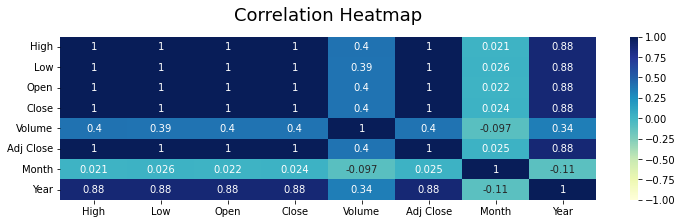

In [22]:
Plo.plot_corr(EDPR)

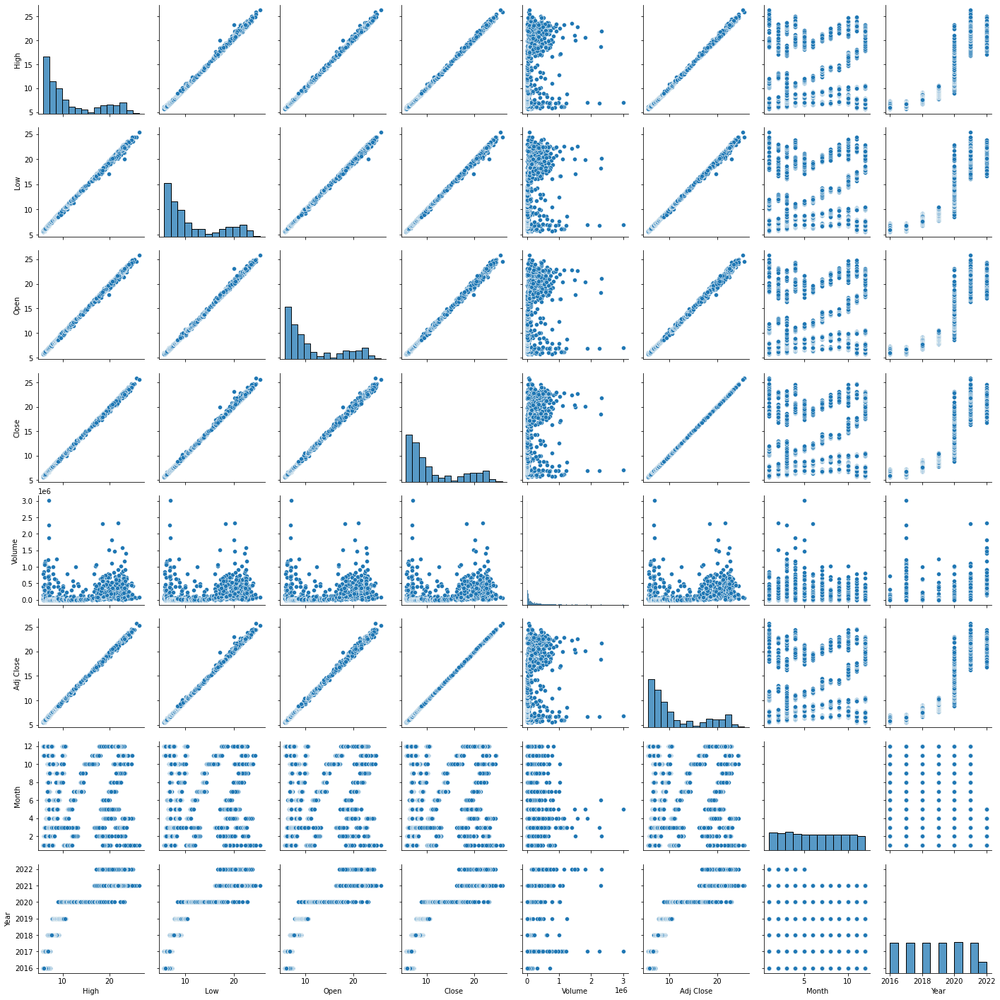

In [23]:
sns.pairplot(EDPR)

<AxesSubplot:>

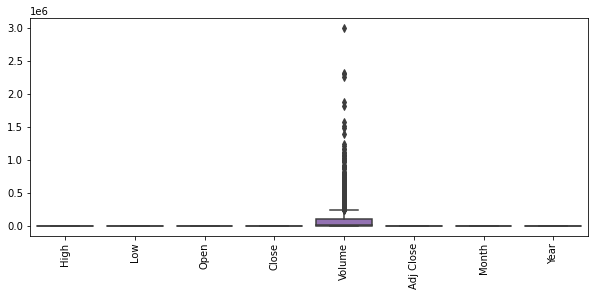

In [24]:
# Initialize the figure with a logarithmic x axis
f, ax = plt.subplots(figsize=(10,4))
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
sns.boxplot(data=EDPR)

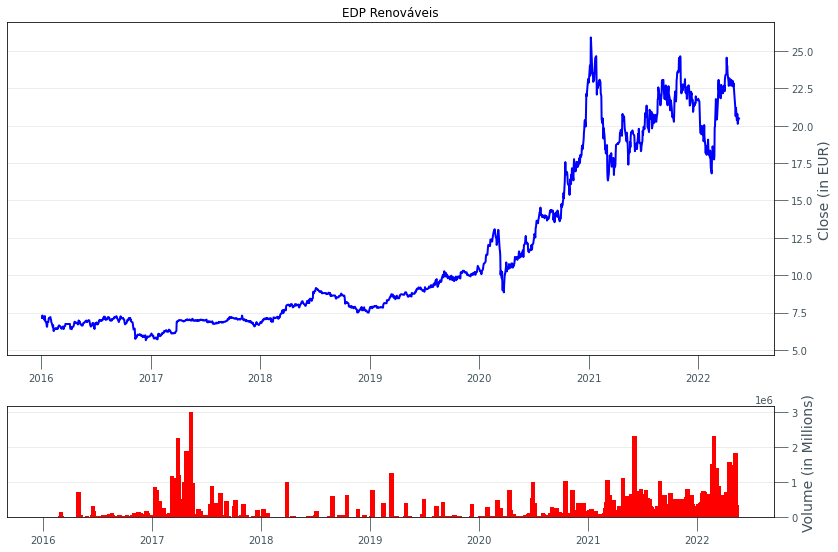

In [25]:
Plo.Close_Vol(EDPR, 'EDP Renováveis')

In [26]:
# We selected the main column  for us
close_EDPR= EDPR['Close']

# freq='B' stands for only weekdays
weekdays_EDPR= pd.date_range(start=start_date, end=end_date, freq='B')

 # We need reindex close using all weekdays as the new index.
close_EDPR= close_EDPR.reindex(weekdays_EDPR)

#We filling the Missing values (NaN) with 'forward fill'
close_EDPR = close_EDPR.fillna(method='ffill')
close_EDPR = close_EDPR.dropna()# delete NaNs if there are more.
#we passed the information into Dataframe and rename the columns
close_EDPR = pd.DataFrame(close_EDPR).dropna().rename(columns= {0: 'Date', 1: 'Close'})
close_EDPR.tail()

,Close
2022-05-10,20.785000
2022-05-11,20.760000
2022-05-12,20.120001
2022-05-13,20.337500
2022-05-16,20.480000


In [27]:
close_EDPR.tail()

,Close
2022-05-10,20.785000
2022-05-11,20.760000
2022-05-12,20.120001
2022-05-13,20.337500
2022-05-16,20.480000


In [28]:
close_EDPR.describe()

,Close
count,1661.000000
mean,11.404795
std,5.622937
min,5.649900
25%,7.006600
50%,8.725000
75%,15.500000
max,25.900000


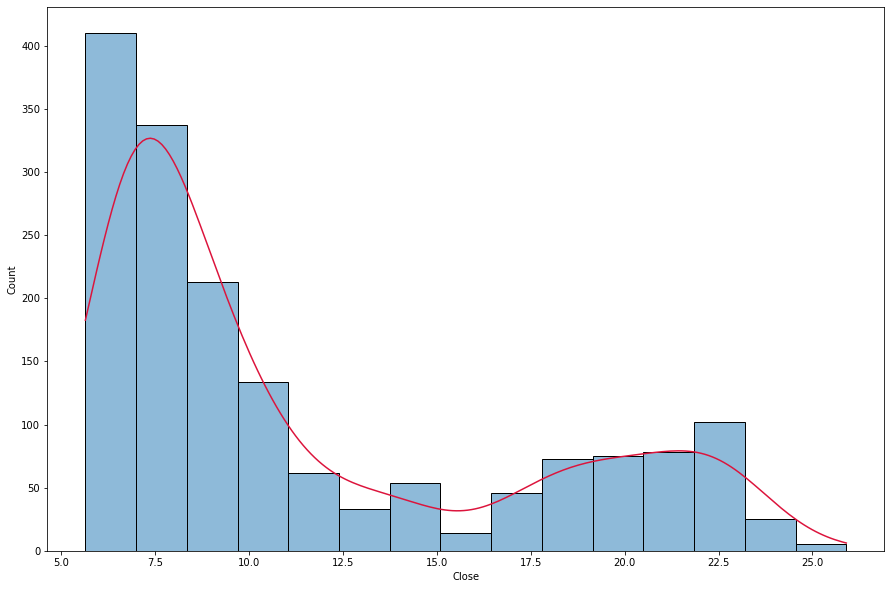

In [29]:
figsize=(3,3)
ax= sns.histplot(close_EDPR['Close'], kde=True);
ax.lines[0].set_color('crimson')

In [30]:
EDPR_df = close_EDPR
EDPR_df 
EDPR_df.to_csv("EDPR_df.csv")

In [31]:
EDPR_df= pd.read_csv('EDPR_df.csv')#We decided works with a CSV for modeling 
EDPR_df.tail()

,Unnamed: 0,Close
1656,2022-05-10,20.785000
1657,2022-05-11,20.760000
1658,2022-05-12,20.120001
1659,2022-05-13,20.337500
1660,2022-05-16,20.480000


In [32]:
#Renaming column Unnamed: 0
list(EDPR_df.columns)

EDPR_df = EDPR_df.rename(columns={'Unnamed: 0': 'Date'})

In [33]:
EDPR_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1661 entries, 0 to 1660
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    1661 non-null   object 
 1   Close   1661 non-null   float64
dtypes: float64(1), object(1)
memory usage: 26.1+ KB


In [34]:
EDPR_df= EDPR_df[['Date', 'Close']]
EDPR_df

,Date,Close
0,2016-01-04,7.135100
1,2016-01-05,7.300600
2,2016-01-06,7.215130
3,2016-01-07,7.219500
4,2016-01-08,7.196500
...,...,...
1656,2022-05-10,20.785000
1657,2022-05-11,20.760000
1658,2022-05-12,20.120001
1659,2022-05-13,20.337500


In [35]:
#we define date and we reindex the dataframe
EDPR_df.index = EDPR_df["Date"]

In [36]:
EDPR_df= EDPR_df.sort_index(ascending=True,axis=0)#sort values
df_1= pd.DataFrame(index=range(0,len(EDPR_df)),columns=['Date','Close'])
for i in range(0,len(df_1)):
    df_1["Close"][i]=EDPR_df["Close"][i]
    df_1["Date"][i]=EDPR_df['Date'][i]

EDPR_df = df_1
#convert  the Date data to datatime Type
EDPR_df["Date"] = pd.to_datetime(EDPR_df.Date, format="%Y/%m/%d")
EDPR_df.tail()

,Date,Close
1656,2022-05-10,20.785
1657,2022-05-11,20.76
1658,2022-05-12,20.120001
1659,2022-05-13,20.3375
1660,2022-05-16,20.48


In [37]:
EDPR_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1661 entries, 0 to 1660
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1661 non-null   datetime64[ns]
 1   Close   1661 non-null   object        
dtypes: datetime64[ns](1), object(1)
memory usage: 26.1+ KB


#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [38]:
VWS.describe()

,High,Low,Open,Close,Volume,Adj Close,Month,Year
count,1610.000000,1610.000000,1610.000000,1610.000000,1.610000e+03,1610.000000,1610.000000,1610.000000
mean,421.910592,412.019983,416.956769,416.854525,2.127622e+05,410.954664,6.311801,2018.701863
std,156.222346,154.040756,155.037068,155.083166,3.942992e+05,151.955375,3.465310,1.846989
min,115.360001,113.000000,113.059998,115.260002,0.000000e+00,114.276527,1.000000,2016.000000
25%,251.924995,244.924995,249.375004,248.418705,3.184075e+04,247.430531,3.000000,2017.000000
50%,445.881622,436.975006,440.923096,441.125000,7.796050e+04,432.750656,6.000000,2019.000000
75%,553.748688,542.908081,548.949997,548.184341,2.018338e+05,539.504578,9.000000,2020.000000
max,730.728699,719.700012,724.500000,719.700012,4.502410e+06,711.659607,12.000000,2022.000000


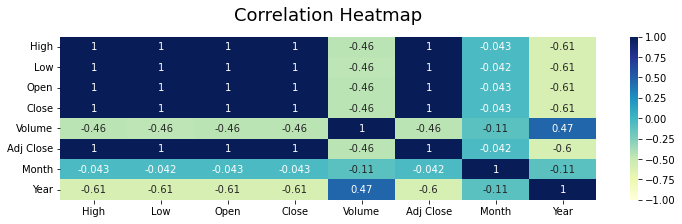

In [39]:
Plo.plot_corr(VWS)

https://www.investopedia.com/articles/active-trading/090115/use-market-volume-data-determine-bottom.asp

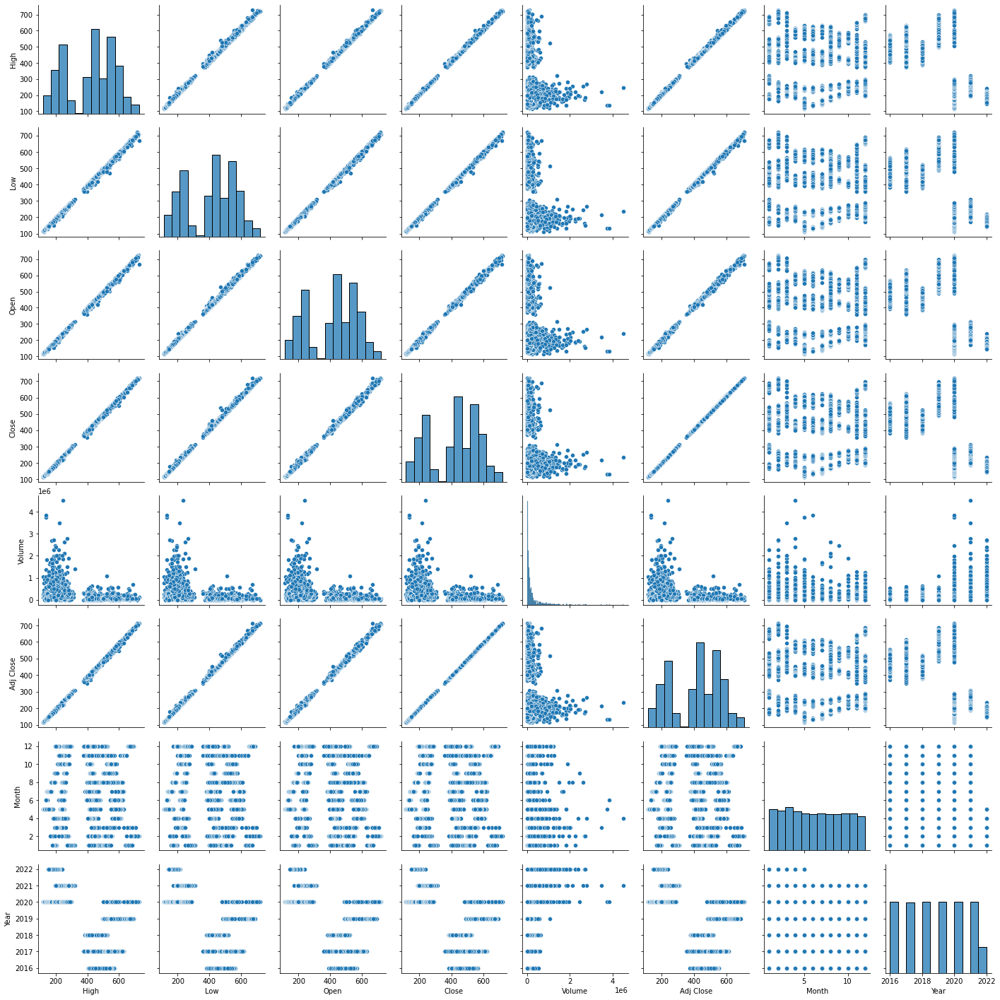

In [40]:
sns.pairplot(VWS)

<AxesSubplot:>

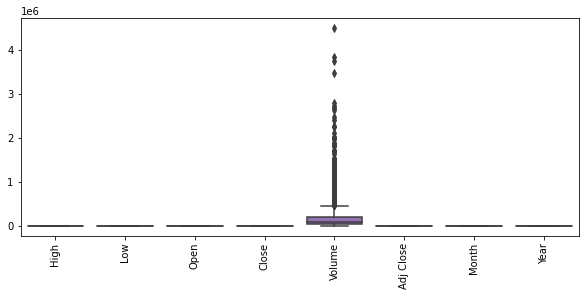

In [41]:
# Initialize the figure with a logarithmic x axis
f, ax = plt.subplots(figsize=(10,4))
ax.set_xticklabels(ax.get_xticklabels(),rotation=90)
sns.boxplot(data=VWS)

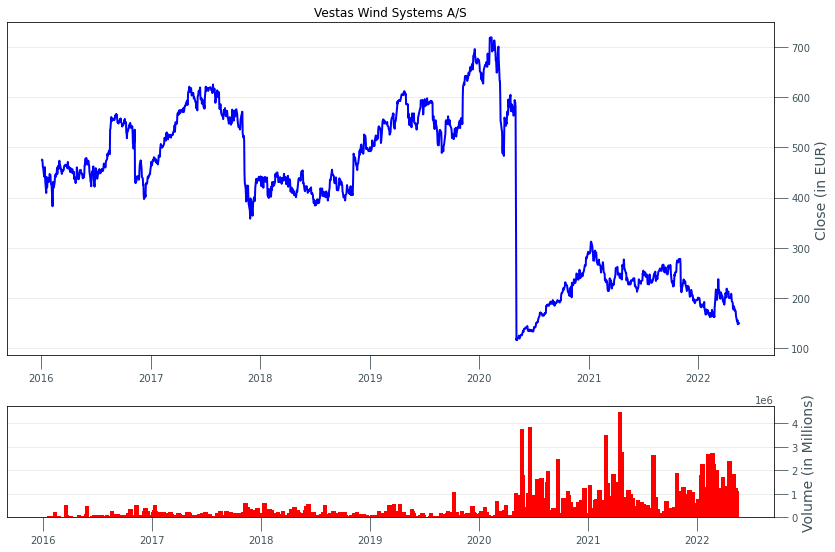

In [42]:
Plo.Close_Vol(VWS, 'Vestas Wind Systems A/S')

In [43]:
# We selected the main column  for us
close_VWS= VWS['Close']

# freq='B' stands for only weekdays
weekdays_VWS= pd.date_range(start=start_date, end=end_date, freq='B')

 # We need to align the existing prices, so we reindex close using all weekdays as the new index.
close_VWS= close_VWS.reindex(weekdays_VWS)

#We filling the Missing values (NaN) with 'forward fill'
close_VWS = close_VWS.fillna(method='ffill')
#we passed the information into Dataframe and rename the columns
close_VWS= pd.DataFrame(close_VWS).dropna().rename(columns= {0: 'Date', 1: 'Close'})
close_VWS.tail()

,Close
2022-05-10,152.490005
2022-05-11,155.229996
2022-05-12,147.080002
2022-05-13,147.080002
2022-05-16,149.149994


In [44]:
close_VWS.describe()

,Close
count,1661.000000
mean,416.917639
std,155.183803
min,115.260002
25%,248.714966
50%,441.093079
75%,548.299988
max,719.700012


In [45]:
VWS_df = close_VWS

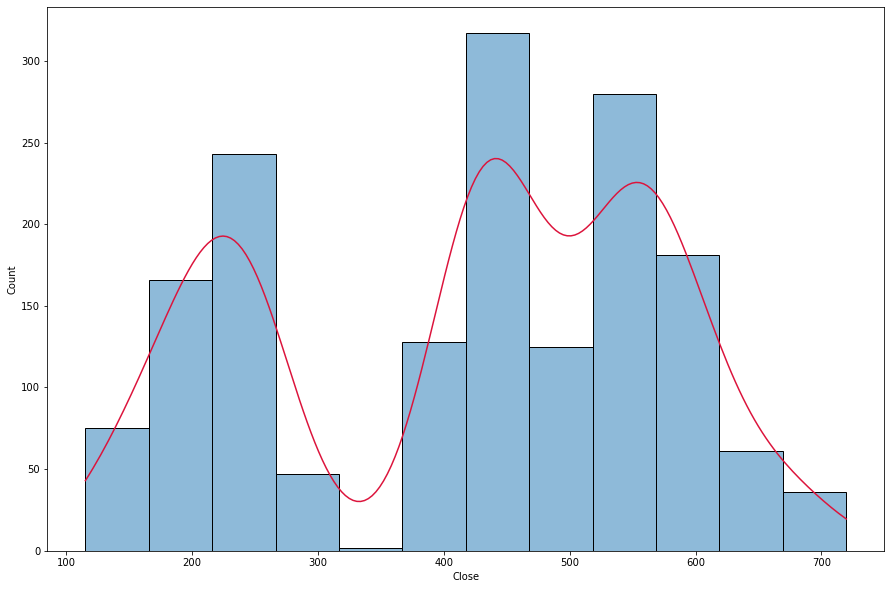

In [46]:
ax= sns.histplot(VWS_df['Close'], kde=True);
ax.lines[0].set_color('crimson')

In [47]:
VWS_df.to_csv("VWS_df.csv")

In [48]:
VWS_df= pd.read_csv('VWS_df.csv')#We decided works with a CSV for modeling 
VWS_df.head()

,Unnamed: 0,Close
0,2016-01-04,475.468903
1,2016-01-05,475.200012
2,2016-01-06,468.399994
3,2016-01-07,460.307312
4,2016-01-08,458.308014


In [49]:
#Renaming column Unnamed: 0
list(VWS_df.columns)

VWS_df = VWS_df.rename(columns={'Unnamed: 0': 'Date'})

In [50]:
VWS_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1661 entries, 0 to 1660
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Date    1661 non-null   object 
 1   Close   1661 non-null   float64
dtypes: float64(1), object(1)
memory usage: 26.1+ KB


In [51]:
VWS_df= VWS_df[['Date', 'Close']]
VWS_df

,Date,Close
0,2016-01-04,475.468903
1,2016-01-05,475.200012
2,2016-01-06,468.399994
3,2016-01-07,460.307312
4,2016-01-08,458.308014
...,...,...
1656,2022-05-10,152.490005
1657,2022-05-11,155.229996
1658,2022-05-12,147.080002
1659,2022-05-13,147.080002


In [52]:
#we define  the dataframe index value as the data column
VWS_df.index = VWS_df["Date"]

In [53]:
VWS_df= VWS_df.sort_index(ascending=True,axis=0)
df_2 = pd.DataFrame(index=range(0,len(VWS_df)),columns=['Date','Close'])
for i in range(0,len(df_2)):
    df_2["Date"][i]=VWS_df['Date'][i]
    df_2["Close"][i]=VWS_df["Close"][i]

VWS_df = df_2
#convert  the Date data to datatime Type
VWS_df["Date"] = pd.to_datetime(VWS_df.Date, format="%Y/%m/%d")
VWS_df.head()

,Date,Close
0,2016-01-04,475.468903
1,2016-01-05,475.200012
2,2016-01-06,468.399994
3,2016-01-07,460.307312
4,2016-01-08,458.308014


In [54]:
VWS_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1661 entries, 0 to 1660
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1661 non-null   datetime64[ns]
 1   Close   1661 non-null   object        
dtypes: datetime64[ns](1), object(1)
memory usage: 26.1+ KB


In [55]:
VWS_df = VWS_df.rename(columns={'Close': 'VWS'})
Stocks_df = VWS_df

In [56]:
Stocks_df

,Date,VWS
0,2016-01-04,475.468903
1,2016-01-05,475.200012
2,2016-01-06,468.399994
3,2016-01-07,460.307312
4,2016-01-08,458.308014
...,...,...
1656,2022-05-10,152.490005
1657,2022-05-11,155.229996
1658,2022-05-12,147.080002
1659,2022-05-13,147.080002


In [57]:
Stocks_df["EDPR"] = EDPR_df["Close"]

In [58]:
Stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1661 entries, 0 to 1660
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1661 non-null   datetime64[ns]
 1   VWS     1661 non-null   object        
 2   EDPR    1661 non-null   object        
dtypes: datetime64[ns](1), object(2)
memory usage: 39.1+ KB


In [59]:
Stocks_df

,Date,VWS,EDPR
0,2016-01-04,475.468903,7.1351
1,2016-01-05,475.200012,7.3006
2,2016-01-06,468.399994,7.21513
3,2016-01-07,460.307312,7.2195
4,2016-01-08,458.308014,7.1965
...,...,...,...
1656,2022-05-10,152.490005,20.785
1657,2022-05-11,155.229996,20.76
1658,2022-05-12,147.080002,20.120001
1659,2022-05-13,147.080002,20.3375


In [60]:
#we define  the dataframe'd index valu as the data column
Stocks_df.index = Stocks_df["Date"]

In [61]:
Stocks_df= Stocks_df.sort_index(ascending=True,axis=0)
df_3 = pd.DataFrame(index=range(0,len(Stocks_df)),columns=['Date','EDPR', 'VWS'])
for i in range(0,len(df_3)):
    df_3["Date"][i]=Stocks_df['Date'][i]
    df_3["EDPR"][i]=Stocks_df["EDPR"][i]
    df_3["VWS"][i]=Stocks_df["VWS"][i]

Stocks_df = df_3
#convert  the Date data to datatime Type
Stocks_df["Date"] = pd.to_datetime(Stocks_df.Date, format="%Y/%m/%d")
Stocks_df.tail()

,Date,EDPR,VWS
1656,2022-05-10,20.785,152.490005
1657,2022-05-11,20.76,155.229996
1658,2022-05-12,20.120001,147.080002
1659,2022-05-13,20.3375,147.080002
1660,2022-05-16,20.48,149.149994


In [62]:
Stocks_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1661 entries, 0 to 1660
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1661 non-null   datetime64[ns]
 1   EDPR    1661 non-null   object        
 2   VWS     1661 non-null   object        
dtypes: datetime64[ns](1), object(2)
memory usage: 39.1+ KB


In [63]:
Stocks_df.tail()

,Date,EDPR,VWS
1656,2022-05-10,20.785,152.490005
1657,2022-05-11,20.76,155.229996
1658,2022-05-12,20.120001,147.080002
1659,2022-05-13,20.3375,147.080002
1660,2022-05-16,20.48,149.149994


In [64]:
import plotly.express as px
graphic = px.line(title = 'Stock price history')
for i in Stocks_df.columns[1:]:
  graphic.add_scatter(x = Stocks_df['Date'], y = Stocks_df[i], name = i)
graphic.show()

In [65]:
#Splinting into X/y
X = Stocks_df.drop('Date', axis=1)
y= Stocks_df['Date']
Stocks_normalized = X
Stocks_normalized.head()

,EDPR,VWS
0,7.1351,475.468903
1,7.3006,475.200012
2,7.21513,468.399994
3,7.2195,460.307312
4,7.1965,458.308014


In [66]:
#scaling
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))
scaler.fit(Stocks_normalized)
Stocks = scaler.transform(Stocks_normalized)
DF= pd.DataFrame(Stocks)
DF.rename(columns= {0: 'EDPR', 1: 'VWS'}, inplace=True)
X = DF
X['Date'] = y
X.set_index(X.columns[-1], inplace=True)
X.reset_index(inplace=True)
Stock_norm = X

In [67]:
Stock_norm.head()

,Date,EDPR,VWS
0,2016-01-04,0.073343,0.595938
1,2016-01-05,0.081516,0.595493
2,2016-01-06,0.077295,0.584243
3,2016-01-07,0.077511,0.570855
4,2016-01-08,0.076375,0.567547


In [68]:
Stock_norm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1661 entries, 0 to 1660
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   Date    1661 non-null   datetime64[ns]
 1   EDPR    1661 non-null   float64       
 2   VWS     1661 non-null   float64       
dtypes: datetime64[ns](1), float64(2)
memory usage: 39.1 KB


In [69]:
#Visualizing the graphic with the normalized data

graphic_norm = px.line(title = 'Stock price history')
for i in Stock_norm.columns[1:]:
  graphic_norm.add_scatter(x = Stock_norm['Date'], y = Stock_norm[i], name = i)
graphic_norm.show()

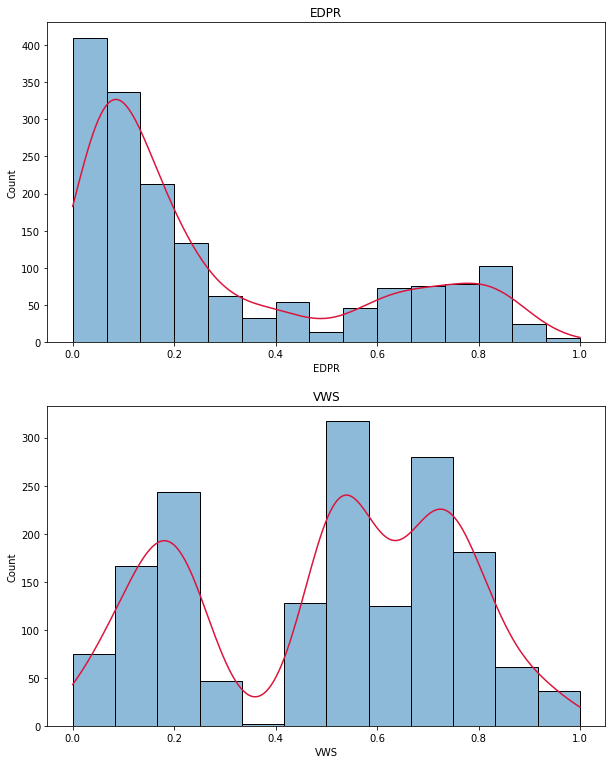

In [70]:
import numpy as np
plt.figure(figsize=(10,20))
i = 1
for i in np.arange(1, len(Stock_norm.columns)):
    plt.subplot(3, 1, i + 1)
    ax=sns.histplot(Stock_norm[Stock_norm.columns[i]], kde = True)
    ax.lines[0].set_color('crimson')
    plt.title(Stock_norm.columns[i])

### II.1- ETS-Decomposition


ETS-Decomposition is a method that allows us to visualize the data after a decomposition of time series into three distinct components: trend, seasonality, and noise.

* Additive decomposition: yt = St + Tt + Rt
* Multiplicative decomposition: yt = St * Tt * Rt

where, 
- S represents the Seasonal variation
- T encodes Trend plus Cycle
- R describes the Residual or the Error component.
Daitan (2019)

In [71]:
# graphs to show seasonal_decompose
def ETS_Decomposition (timeseries):
    decomposition = sm.tsa.seasonal_decompose(timeseries, model='mul',freq=30)
    fig = decomposition.plot()
    fig.set_size_inches(14,7)
    plt.show()

#### A.- EDP Renováveis (0ML1.IL)

In [72]:
dateparse = lambda dates: pd.datetime.strptime(dates, '%Y-%m-%d')
EDPR= pd.read_csv('EDPR.csv',index_col='Date',parse_dates=['Date'],date_parser=dateparse, dayfirst=True)
EDPR.head(2)

,High,Low,Open,Close,Volume,Adj Close,WeekDay,Month,Year
Date,,,,,,,,,
2016-01-04,7.1351,7.1351,7.1351,7.1351,0.0,6.866566,Monday,1,2016
2016-01-05,7.3006,7.3006,7.3006,7.3006,150.0,7.025838,Tuesday,1,2016


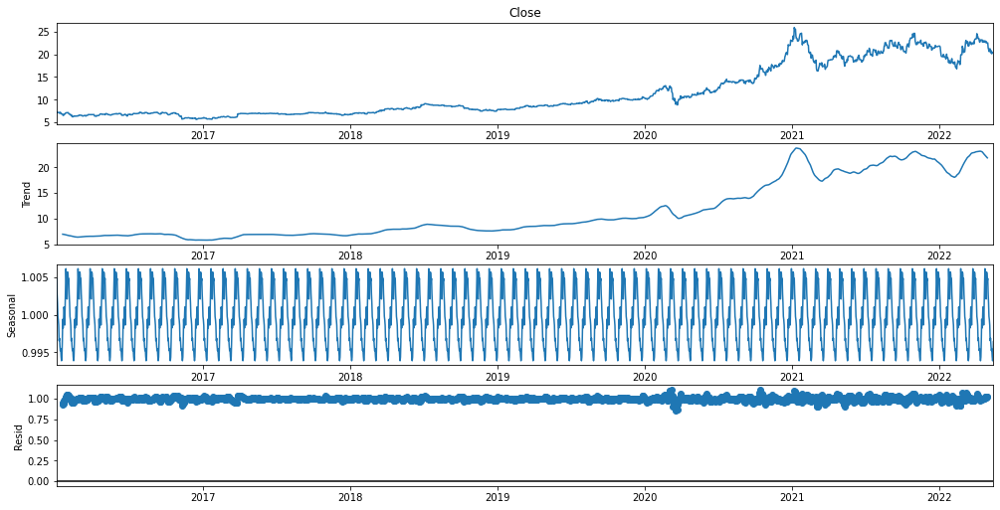

In [73]:
Plo.ETS_Decomposition(EDPR['Close'])

#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [74]:
dateparse = lambda dates: pd.datetime.strptime(dates, '%Y-%m-%d')
VWS= pd.read_csv('VWS.csv',index_col='Date', parse_dates=['Date'],date_parser=dateparse, dayfirst=True)
VWS.head(2)

,High,Low,Open,Close,Volume,Adj Close,WeekDay,Month,Year
Date,,,,,,,,,
2016-01-04,483.998474,475.468903,473.500000,475.468903,2528.0,464.095367,Monday,1,2016
2016-01-05,476.799988,465.432190,479.899994,475.200012,1738.0,463.832947,Tuesday,1,2016


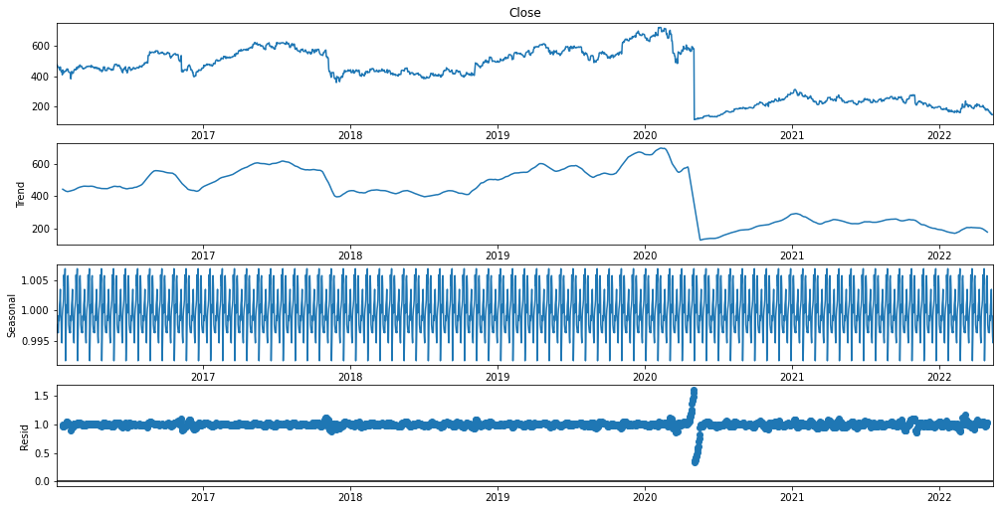

In [75]:
Plo.ETS_Decomposition (VWS['Close'])

### II.2.- Augmented Dickey–Fuller test

The Augmented Dickey-Fuller test helps us to detect if a time series is or not “stationary”. Stationary means that the data has no trend, exhibits constant variance over time, and has a constant autocorrelation structure over time. It is ‘stationarize’ the time series as part of the process of fitting a model.Zach (2021) 

In [76]:
def ADFuller(timeseries):
    result = adfuller(timeseries, autolag='AIC')
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t{}: {} - The data is {} stationary with {}% confidence'.format(key, value, 'not' if value < result[0] else '', 100-int(key[:-1])))
        

#### A.- EDP Renováveis (0ML1.IL)

In [77]:
ADFuller(EDPR['Close'])

ADF Statistic: -0.673614
p-value: 0.853466
Critical Values:
	1%: -3.4331852467356576 - The data is not stationary with 99% confidence
	5%: -2.8627925514094192 - The data is not stationary with 95% confidence
	10%: -2.5674367893217664 - The data is not stationary with 90% confidence


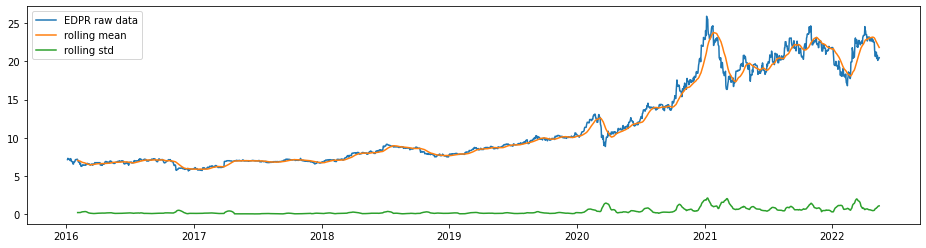

In [78]:
Plo.plot_stationarity(EDPR['Close'],'EDPR raw data')

#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [79]:
ADFuller(VWS['Close'])

ADF Statistic: -1.562059
p-value: 0.502619
Critical Values:
	1%: -3.4331669266775915 - The data is not stationary with 99% confidence
	5%: -2.8627844618211444 - The data is not stationary with 95% confidence
	10%: -2.567432482225435 - The data is not stationary with 90% confidence


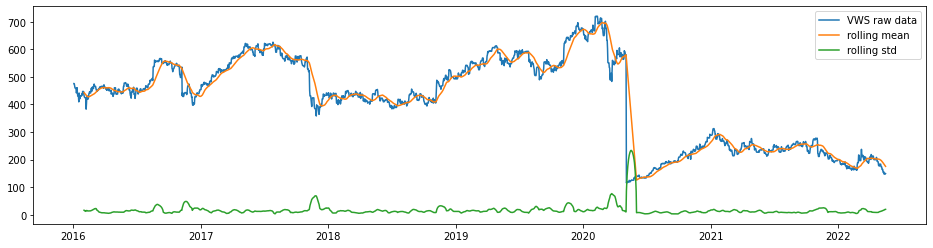

In [80]:
Plo.plot_stationarity(VWS['Close'],'VWS raw data')

### II.3.- Make the Data Stationary

### II.3.1.- Detrending: 

- Removing the underlying trend in the time series.

#### A.- EDP Renováveis (0ML1.IL)

ADF Statistic: -11.011924
p-value: 0.000000
Critical Values:
	1%: -3.433202561761398 - The data is  stationary with 99% confidence
	5%: -2.8628001971599955 - The data is  stationary with 95% confidence
	10%: -2.5674408601155303 - The data is  stationary with 90% confidence


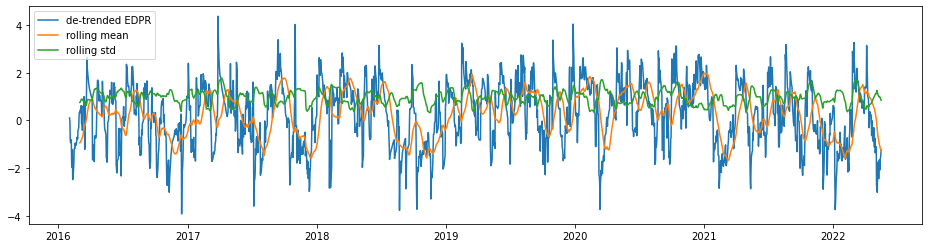

In [81]:
EDPR['Detrend']=  (EDPR['Close'] - EDPR['Close'].rolling(30).mean())/EDPR['Close'].rolling(30).std().dropna()
Plo.plot_stationarity(EDPR['Detrend'],'de-trended EDPR')
ADFuller(EDPR['Detrend'].dropna(inplace=False))

#### B.- Vestas Wind Systems A/S (0NMK.IL)

ADF Statistic: -10.202423
p-value: 0.000000
Critical Values:
	1%: -3.4332038066451385 - The data is  stationary with 99% confidence
	5%: -2.8628007468583427 - The data is  stationary with 95% confidence
	10%: -2.5674411527893164 - The data is  stationary with 90% confidence


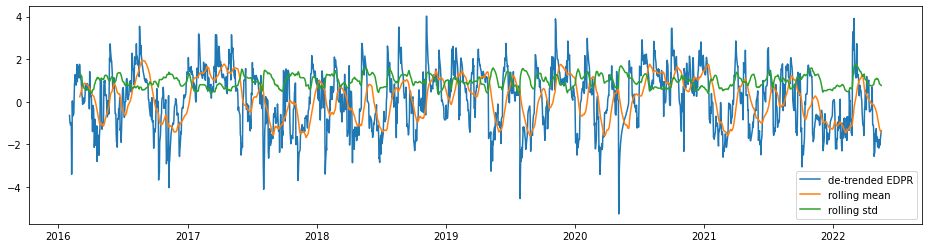

In [82]:
VWS['Detrend'] =  (VWS['Close'] - VWS['Close'].rolling(30).mean())/VWS['Close'].rolling(30).std().dropna()
Plo.plot_stationarity(VWS['Detrend'],'de-trended EDPR')
ADFuller(VWS['Detrend'].dropna(inplace=False))

### II.3.2.-  Differencing

#### A.- EDP Renováveis (0ML1.IL)

- Removing the underlying seasonal or cyclical patterns in the time series. 

In [83]:
EDPR['Differencing']=  EDPR['Close'] - EDPR['Close'].shift(1).dropna()

ADF Statistic: -11.066696
p-value: 0.000000
Critical Values:
	1%: -3.4331852467356576 - The data is  stationary with 99% confidence
	5%: -2.8627925514094192 - The data is  stationary with 95% confidence
	10%: -2.5674367893217664 - The data is  stationary with 90% confidence


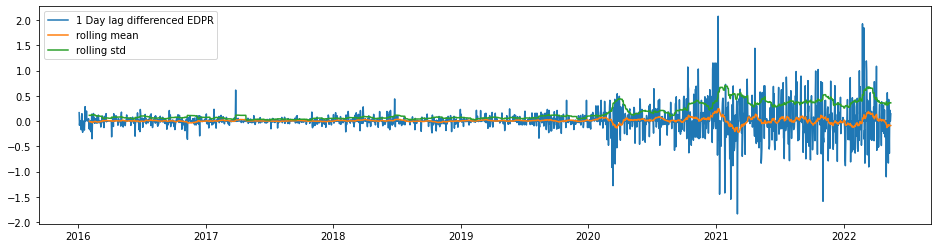

In [84]:
Plo.plot_stationarity(EDPR['Differencing'], '1 Day lag differenced EDPR')
ADFuller(EDPR['Differencing'].dropna(inplace=False))

#### B.- Vestas Wind Systems A/S (0NMK.IL)

ADF Statistic: -48.437854
p-value: 0.000000
Critical Values:
	1%: -3.43316814064601 - The data is  stationary with 99% confidence
	5%: -2.862784997874728 - The data is  stationary with 95% confidence
	10%: -2.56743276763333 - The data is  stationary with 90% confidence


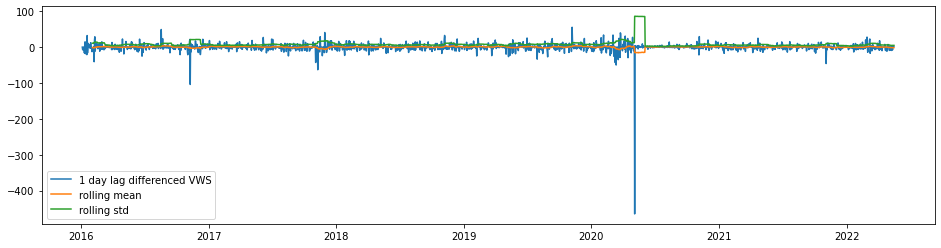

In [85]:
VWS['Differencing'] =  VWS['Close'] - VWS['Close'].shift(1).dropna()

Plo.plot_stationarity(VWS['Differencing'], '1 day lag differenced VWS')
ADFuller(VWS['Differencing'].dropna(inplace=False))

### II.3.3.-  Detrending + Differencing

- Removing the underlying trend and the seasonal or cyclical patterns in the time series.

#### A.- EDP Renováveis (0ML1.IL)

ADF Statistic: -15.683844
p-value: 0.000000
Critical Values:
	1%: -3.4332226111473805 - The data is  stationary with 99% confidence
	5%: -2.86280905025955 - The data is  stationary with 95% confidence
	10%: -2.567445573742053 - The data is  stationary with 90% confidence


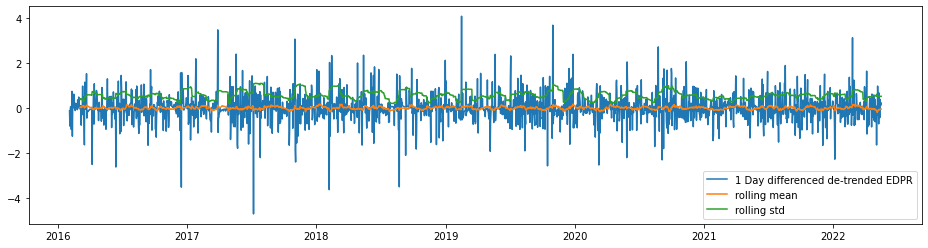

In [86]:
EDPR['Detrend_Diff']=  EDPR['Detrend']- EDPR['Detrend'].shift(1).dropna()
Plo.plot_stationarity(EDPR['Detrend_Diff'],'1 Day differenced de-trended EDPR')
ADFuller(EDPR['Detrend_Diff'].dropna(inplace=False))

#### B.- Vestas Wind Systems A/S (0NMK.IL)

ADF Statistic: -17.387478
p-value: 0.000000
Critical Values:
	1%: -3.4332175724250398 - The data is  stationary with 99% confidence
	5%: -2.8628068253436054 - The data is  stationary with 95% confidence
	10%: -2.567444389136486 - The data is  stationary with 90% confidence


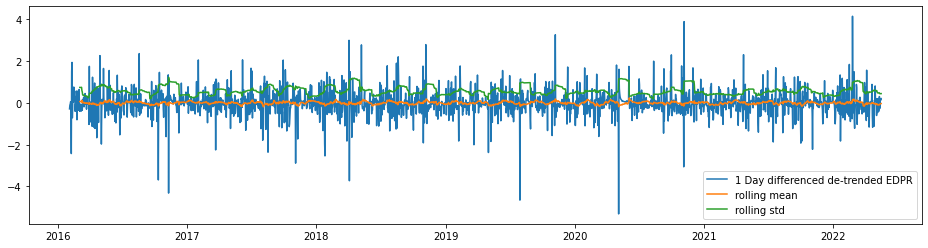

In [87]:
VWS['Detrend_Diff'] =  VWS['Detrend']- VWS['Detrend'].shift(1)

Plo.plot_stationarity(VWS['Detrend_Diff'],'1 Day differenced de-trended EDPR')
ADFuller(VWS['Detrend_Diff'].dropna(inplace=False))

### II.4- Identifying AR and MA orders by ACF and PACF plots

Plotting  ACF and PACF help us to undertand how to choose the best MA(q) and AR(p) values:

- ACF= Describes how well the present value of the series is related with its past values 
- PACF= It finds correlation of the residuals

Blue bars on the plots are the error bands, everything in this area is not statistically significant.  In linear regression models performs best when the predictors are not correlated and are independent of each other. 



A Q-Q plot is a scatterplot created by plotting two sets of quantiles against one another. If both sets of quantiles came from the same distribution, we should see the points forming a line that’s roughly straight.

In [88]:
# Q-Q plot of the quantiles of x versus the quantiles/ppf of a distribution.
def plot_QQ(timeseries):
    x = sm.qqplot(timeseries, line= 's')

#### A.- EDP Renováveis (0ML1.IL)

ADF Statistic: -15.683844
p-value: 0.000000
Critical Values:
	1%: -3.4332226111473805 - The data is  stationary with 99% confidence
	5%: -2.86280905025955 - The data is  stationary with 95% confidence
	10%: -2.567445573742053 - The data is  stationary with 90% confidence


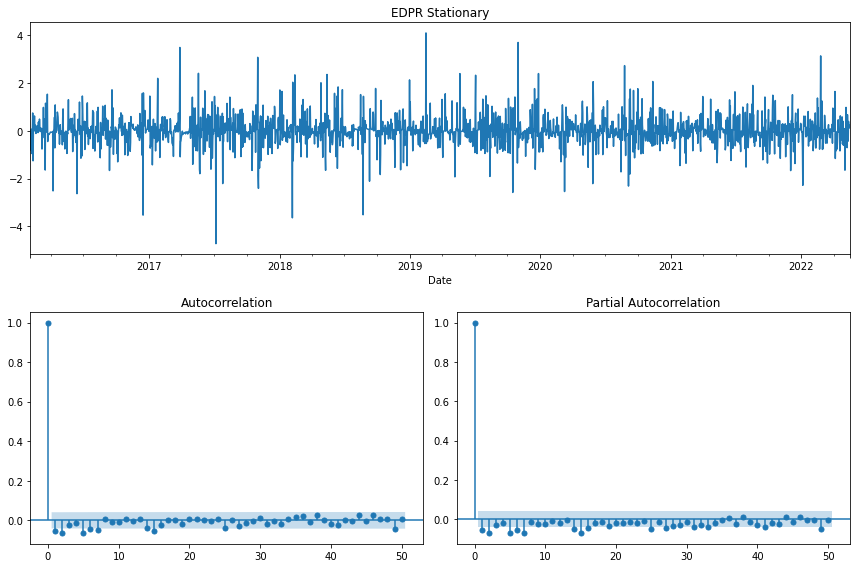

In [89]:
# Drop the first row of 'Close' column because It has 'NaN' value
ADFuller(EDPR['Detrend_Diff'].dropna(inplace=False))
Plo.plot_ACF_PACF(EDPR['Detrend_Diff'].dropna(inplace=False) , 'EDPR Stationary')

It looks like the ACF is lagged by 7 and that PACF is geometric. If both ACF and PACF plots demonstrate a gradual decreasing pattern, then the ARMA process should be considered for modelling.

<a href="https://towardsdatascience.com/identifying-ar-and-ma-terms-using-acf-and-pacf-plots-in-time-series-forecasting-ccb9fd073db8">Masum, M. (2020) </a>


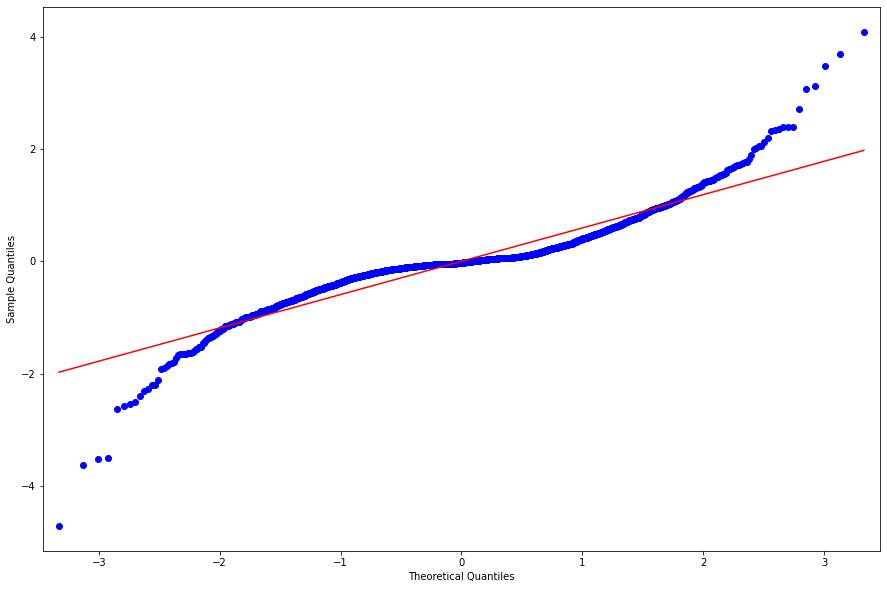

In [90]:
plot_QQ(EDPR['Detrend_Diff'].dropna())

#### B.- Vestas Wind Systems A/S (0NMK.IL)

ADF Statistic: -15.683844
p-value: 0.000000
Critical Values:
	1%: -3.4332226111473805 - The data is  stationary with 99% confidence
	5%: -2.86280905025955 - The data is  stationary with 95% confidence
	10%: -2.567445573742053 - The data is  stationary with 90% confidence


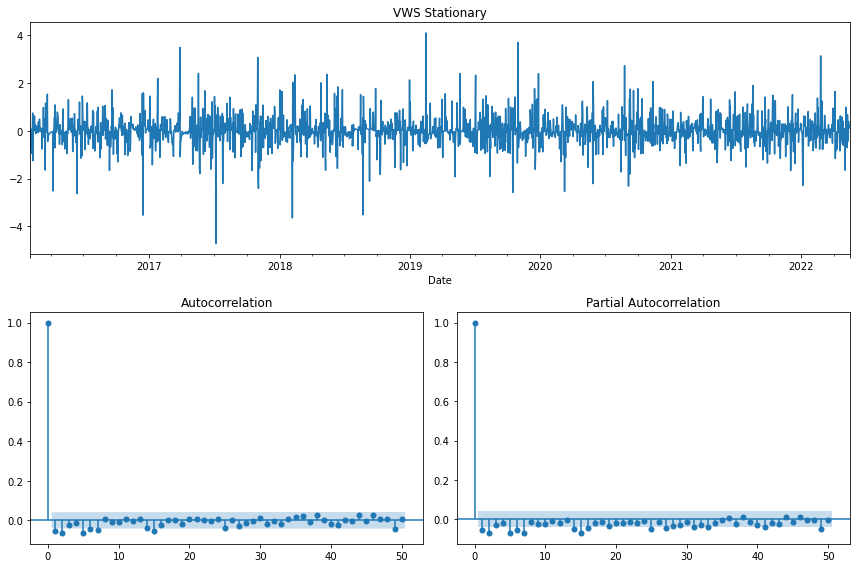

In [91]:
# Drop the first row of 'Close' column because It has 'NaN' value
ADFuller(EDPR['Detrend_Diff'].dropna(inplace=False))
Plo.plot_ACF_PACF(EDPR['Detrend_Diff'].dropna(inplace=False) , 'VWS Stationary')

It looks like the ACF is lagged by 3 and that PACF is geometric. If both ACF and PACF plots demonstrate a gradual decreasing pattern, then the ARMA process should be considered for modelling. 
<a href="https://towardsdatascience.com/identifying-ar-and-ma-terms-using-acf-and-pacf-plots-in-time-series-forecasting-ccb9fd073db8">Masum, M. (2020) </a>


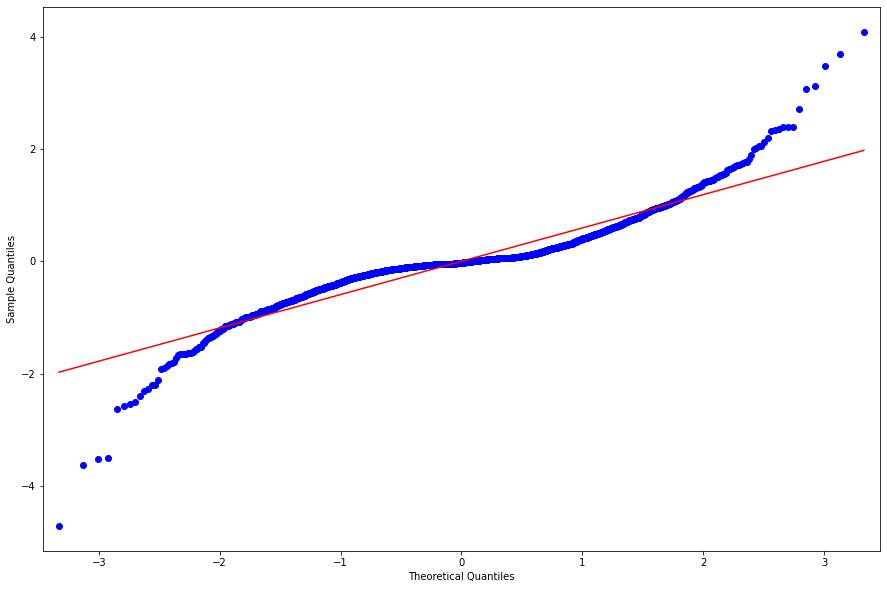

In [92]:
plot_QQ(EDPR['Detrend_Diff'].dropna(inplace=False))

### III.-Modelling

#### A.- EDP Renováveis (0ML1.IL)

In [93]:
from sklearn.model_selection import TimeSeriesSplit

In [94]:
#Specify fold and perform splitting
tscv = TimeSeriesSplit(n_splits=3)
tscv.split(EDPR)

#Find out no of observations in train and test sets
i=0
for train_A, test_A in tscv.split(EDPR):
    i=i+1
    print ("Shape EDPR train%s=%s" % (i, len(train_A)))
    print ("Shape EDPR test%s=%s" % (i, len(test_A)))

Shape EDPR train1=582
Shape EDPR test1=581
Shape EDPR train2=1163
Shape EDPR test2=581
Shape EDPR train3=1744
Shape EDPR test3=581


In [95]:
#Splitting according to the above description
trainA1, testA1 = EDPR.iloc[:500, 0], EDPR.iloc[500:890, 0]
trainA2, testA2 = EDPR.iloc[:890, 0], EDPR.iloc[890:1080, 0]
trainA3, testA3 = EDPR.iloc[:1080, 0], EDPR.iloc[1080:1240, 0]

In [96]:
# Divide into train and validation set to calculate R-squared score and mean absolute percentage error 
train_A = EDPR[:int(0.85 * (len(EDPR)))]
test_A  = EDPR[int(0.85 * (len(EDPR))):]
train_A.shape, test_A.shape

((1976, 12), (349, 12))

#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [97]:
#Specify fold and perform splitting
tscv = TimeSeriesSplit(n_splits=3)
tscv.split(VWS)

#Find out no of observations in train and test sets
i=0
for train_B, test_B in tscv.split(VWS):
    i=i+1
    print ("VWS train%s=%s" % (i, len(train_B)))
    print ("VWS test%s=%s" % (i, len(test_B)))

VWS train1=582
VWS test1=581
VWS train2=1163
VWS test2=581
VWS train3=1744
VWS test3=581


In [98]:
# Divide into train and validation set to calculate R-squared score and mean absolute percentage error 
train_B = VWS[:int(0.85 * (len(VWS)))]
test_B  = VWS[int(0.85 * (len(VWS))):]

train_B.shape, test_B.shape

((1976, 12), (349, 12))

### III.1.- Moving Averages (MA)

-Process where the present value of series is defined as a linear combination of past errors.


In [99]:
w= 20

#### A.- EDP Renováveis (0ML1.IL)

In [100]:
#create moving average by applying a mean function to a rolling window.
EDPR['MA-RW'] = EDPR['Close'].rolling(window=w).mean()
#EDPR.head()

In [101]:
#create moving average by applying a mean function to a ewm (Exponentially Weighted Moving Average)
EDPR['MA_EWM'] = EDPR['Close'].ewm(span=w,adjust=False).mean()
#EDPR.head()

In [102]:
#create moving average by applying Simple Exponential Smoothing from statmodels Holt-Winters
warnings.filterwarnings('ignore') 
span = w
alpha = 2/(span+1)
EDPR['MA_SES']=SimpleExpSmoothing(EDPR['Close']).fit(smoothing_level=alpha,optimized=False).fittedvalues


##### Validating the Forecast

In [103]:
start = len(train_A)
end   = len(train_A) + len(test_A) - 1


#First fold RMSE
model1 = SimpleExpSmoothing(EDPR['Close']).fit()
pred1 = model1.predict(start=start , end=end)

In [104]:
# Create a dataframe to store r2 score
MA_SES_EDPR = pd.DataFrame({'r2_score': r2_score(test_A['Close'], pred1)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
MA_SES_EDPR['Model'] = 'MA_SES'
MA_SES_EDPR.set_index(['Model'], inplace=True)
MA_SES_EDPR['mean_absolute_error'] = mean_absolute_error(test_A['Close'], pred1)
MA_SES_EDPR['mean_squared_error'] = mean_squared_error(test_A['Close'], pred1)
MA_SES_EDPR['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_A['Close'], pred1))
MA_SES_EDPR['mean_absolute_percentage_error'] = np.mean(np.abs(pred1 - test_A['Close'])
                                                               /np.abs(test_A['Close']))*100 
# Display the results
MA_SES_EDPR

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
MA_SES,0.940186,0.262708,0.164509,0.405597,1.251983


In [105]:
#create moving average by applying Double Exponential Smoothing from statmodels Holt-Winters
EDPR['MA_Holt-Winters'] = ExponentialSmoothing(EDPR['Close'], trend='add').fit().fittedvalues



##### Validating the Forecast

In [106]:
start = len(train_A)
end   = len(train_A) + len(test_A) - 1


#First fold RMSE
model1 = ExponentialSmoothing(EDPR['Close'], seasonal='add',trend='add', seasonal_periods=12).fit()
pred1 = model1.predict(start=start , end=end)

In [107]:
# Create a dataframe to store r2 score
MA_HoltWinters_EDPR = pd.DataFrame({'r2_score': r2_score(test_A['Close'], pred1)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
MA_HoltWinters_EDPR['Model'] = 'MA_Holt-Winters'
MA_HoltWinters_EDPR.set_index(['Model'], inplace=True)
MA_HoltWinters_EDPR['mean_absolute_error'] = mean_absolute_error(test_A['Close'], pred1)
MA_HoltWinters_EDPR['mean_squared_error'] = mean_squared_error(test_A['Close'], pred1)
MA_HoltWinters_EDPR['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_A['Close'], pred1))
MA_HoltWinters_EDPR['mean_absolute_percentage_error'] = np.mean(np.abs(pred1 - test_A['Close'])
                                                               /np.abs(test_A['Close']))*100 
# Display the results
MA_HoltWinters_EDPR

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
MA_Holt-Winters,0.940913,0.265158,0.162509,0.403124,1.264101


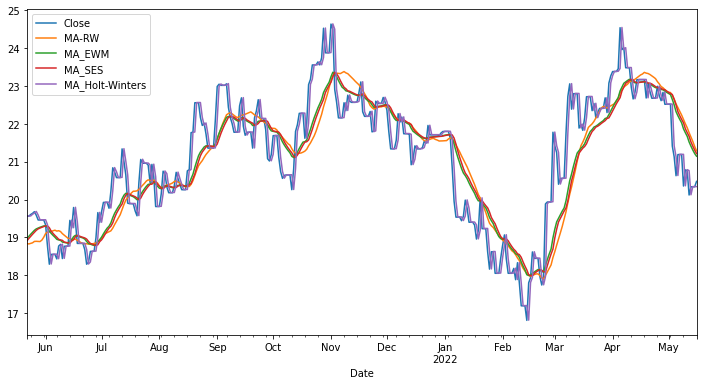

In [108]:
#Plotting the accuracy of the MA
EDPR[['Close','MA-RW','MA_EWM','MA_SES','MA_Holt-Winters']].iloc[-360:].plot(figsize=(12,6)).autoscale(axis='x',tight=True);

#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [109]:
#create moving average by applying a mean function to a rolling window.
VWS['MA-RW'] = VWS['Close'].rolling(window=w).mean()
#VWS.head()

In [110]:
#create moving average by applying a mean function to a ewm (Exponentially Weighted Moving Average)
VWS['MA_EWM'] = VWS['Close'].ewm(span=w,adjust=False).mean()
#VWS.head()

In [111]:
warnings.filterwarnings('ignore') 
#create moving average by applying Simple Exponential Smoothing from statmodels Holt-Winters
span = w
alpha = 2/(span+1)
VWS.asfreq(freq='b')
VWS['MA_SES']=SimpleExpSmoothing(VWS['Close']).fit(smoothing_level=alpha,optimized=False).fittedvalues

##### Validating the Forecast

In [112]:
start = len(train_B)
end   = len(train_B) + len(test_B) - 1

model2 = ExponentialSmoothing(VWS['Close'], seasonal='mul',trend='add', seasonal_periods=12).fit()
pred2 = model2.predict(start=start , end=end)

In [113]:
# Create a dataframe to store r2 score
MA_SES_VWS = pd.DataFrame({'r2_score': r2_score(test_B['Close'], pred2)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
MA_SES_VWS['Model'] = 'MA_SES'
MA_SES_VWS.set_index(['Model'], inplace=True)
MA_SES_VWS['mean_absolute_error'] = mean_absolute_error(test_B['Close'], pred2)
MA_SES_VWS['mean_squared_error'] = mean_squared_error(test_B['Close'], pred2)
MA_SES_VWS['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_B['Close'], pred2))
MA_SES_VWS['mean_absolute_percentage_error'] = np.mean(np.abs(pred2 - test_B['Close'])
                                                               /np.abs(test_B['Close']))*100 
# Display the results
MA_SES_VWS

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
MA_SES,0.955942,4.495328,43.662503,6.607761,2.097265


In [114]:
#create moving average by applying Double Exponential Smoothing from statmodels Holt-Winters
VWS['MA_Holt-Winters'] = ExponentialSmoothing(VWS['Close'], trend='add').fit().fittedvalues

In [115]:
start = len(train_B)
end   = len(train_B) + len(test_B) - 1

model2 = ExponentialSmoothing(VWS['Close'], seasonal='mul',trend='add', seasonal_periods=12).fit()
pred2 = model2.predict(start=start , end=end)

In [116]:
# Create a dataframe to store r2 score
MA_HoltWinters_VWS = pd.DataFrame({'r2_score': r2_score(test_B['Close'], pred2)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
MA_HoltWinters_VWS['Model'] = 'MA_Holt-Winters'
MA_HoltWinters_VWS.set_index(['Model'], inplace=True)
MA_HoltWinters_VWS['mean_absolute_error'] = mean_absolute_error(test_B['Close'], pred2)
MA_HoltWinters_VWS['mean_squared_error'] = mean_squared_error(test_B['Close'], pred2)
MA_HoltWinters_VWS['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_B['Close'], pred2))
MA_HoltWinters_VWS['mean_absolute_percentage_error'] = np.mean(np.abs(pred2 - test_B['Close'])
                                                               /np.abs(test_B['Close']))*100 
# Display the results
MA_HoltWinters_VWS

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
MA_Holt-Winters,0.955942,4.495328,43.662503,6.607761,2.097265


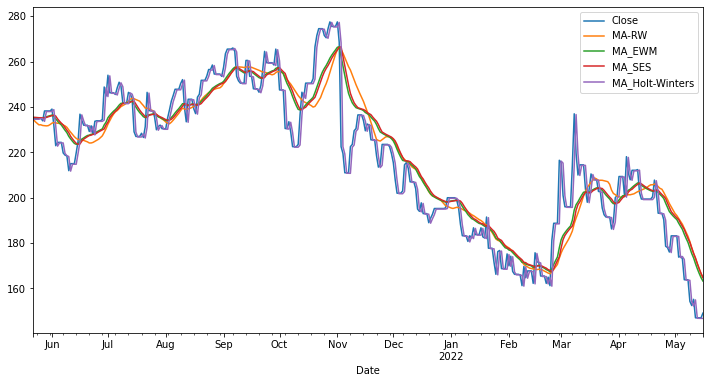

In [117]:
#Plotting the accuracy of the MA
VWS[['Close','MA-RW','MA_EWM','MA_SES','MA_Holt-Winters']].iloc[-360:].plot(figsize=(12,6)).autoscale(axis='x',tight=True);

### III.2.- ARMA

#### A.- EDP Renováveis (0ML1.IL)

Month: 20 working days

In [118]:
arma_EDPR = smtsa.ARMA(EDPR['Close'].tolist(), order=(1, 0)).fit(maxlag=20, method='mle', trend='nc') 

In [119]:
EDPR['ARMA']= arma_EDPR.predict()
arma_EDPR.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                 2325
Model:                     ARMA(1, 0)   Log Likelihood                  96.557
Method:                           mle   S.D. of innovations              0.232
Date:                Tue, 17 May 2022   AIC                           -189.113
Time:                        12:55:21   BIC                           -177.610
Sample:                             0   HQIC                          -184.922
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1.y        0.9999      0.000   6339.881      0.000       1.000       1.000
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0001           +0.0000j            1.0001            0.0000
-----------------------------------------------------------------------------
"""

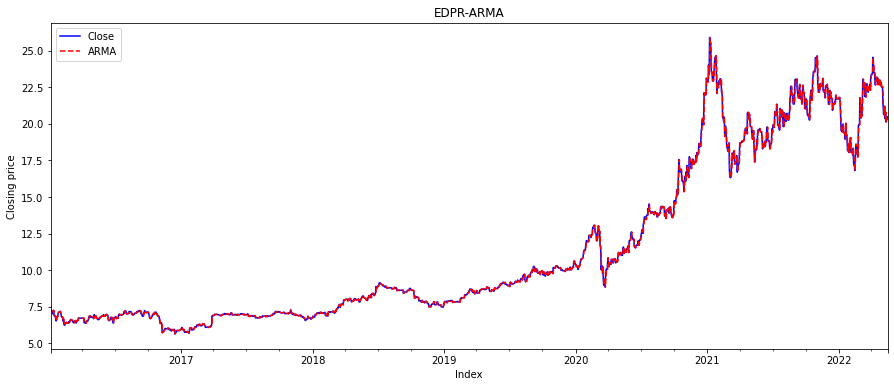

In [120]:
Plo.plot_models(EDPR['Close'], EDPR['ARMA'], 'EDPR-ARMA')

##### Validating the Forecast

In [121]:
start = len(train_A)
end   = len(train_A) + len(test_A) - 1
predictions = arma_EDPR.predict(start = start, end = end, dynamic = False, typ = 'levels')

# Create a dataframe to store r2 score
R_arma_EDPR = pd.DataFrame({'r2_score': r2_score(test_A['Close'], predictions)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
R_arma_EDPR['Model'] = 'ARMA'
R_arma_EDPR.set_index(['Model'], inplace=True)
R_arma_EDPR['mean_absolute_error'] = mean_absolute_error(test_A['Close'], predictions)
R_arma_EDPR['mean_squared_error'] = mean_squared_error(test_A['Close'], predictions)
R_arma_EDPR['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_A['Close'], predictions))
R_arma_EDPR['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - test_A['Close'])
                                                               /np.abs(test_A['Close']))*100 
# Display the results
R_arma_EDPR

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
ARMA,0.940185,0.263461,0.164511,0.4056,1.25545


#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [122]:
VWS=VWS.dropna()

In [123]:
arma_VWS = smtsa.ARMA(VWS['Close'].tolist(), order=(12, 0)).fit(maxlag=20, method='mle', trend='c') 

In [124]:
VWS['ARMA']= arma_VWS.predict()
arma_VWS.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                 2295
Model:                    ARMA(12, 0)   Log Likelihood               -9037.002
Method:                           mle   S.D. of innovations             12.399
Date:                Tue, 17 May 2022   AIC                          18102.003
Time:                        12:55:49   BIC                          18182.342
Sample:                             0   HQIC                         18131.297
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        387.0981     77.638      4.986      0.000     234.931     539.265
ar.L1.y        0.9967      0.021     47.769      0.000       0.956       1.038
ar.L2.y       -0.0028      0.029     -0.095      0.925      -0.061       0.055
ar.L3.y        0.0299      0.029      1.017      0.309      -0.028       0.088
ar.L4.y       -0.0236      0.029     -0.800      0.423      -0.081       0.034
ar.L5.y        0.0065      0.029      0.221      0.825      -0.051       0.064
ar.L6.y       -0.0500      0.030     -1.694      0.090      -0.108       0.008
ar.L7.y        0.0362      0.030      1.226      0.220      -0.022       0.094
ar.L8.y       -0.0261      0.030     -0.882      0.378      -0.084       0.032
ar.L9.y        0.0258      0.030      0.873      0.383      -0.032       0.084
ar.L10.y       0.0399      0.030      1.351      0.177      -0.018       0.098
ar.L11.y      -0.0373      0.030     -1.264      0.206      -0.095       0.021
ar.L12.y       0.0018      0.021      0.086      0.932      -0.039       0.043
                                    Roots                                     
==============================================================================
                   Real          Imaginary           Modulus         Frequency
------------------------------------------------------------------------------
AR.1            -1.1235           -0.7489j            1.3502           -0.4064
AR.2            -1.1235           +0.7489j            1.3502            0.4064
AR.3            -1.4939           -0.0000j            1.4939           -0.5000
AR.4            -0.4196           -1.2929j            1.3593           -0.2999
AR.5            -0.4196           +1.2929j            1.3593            0.2999
AR.6             0.4091           -1.3024j            1.3651           -0.2016
AR.7             0.4091           +1.3024j            1.3651            0.2016
AR.8             1.0029           -0.0000j            1.0029           -0.0000
AR.9             1.1857           -0.7300j            1.3924           -0.0878
AR.10            1.1857           +0.7300j            1.3924            0.0878
AR.11            1.5560           -0.0000j            1.5560           -0.0000
AR.12           19.6141           -0.0000j           19.6141           -0.0000
------------------------------------------------------------------------------
"""

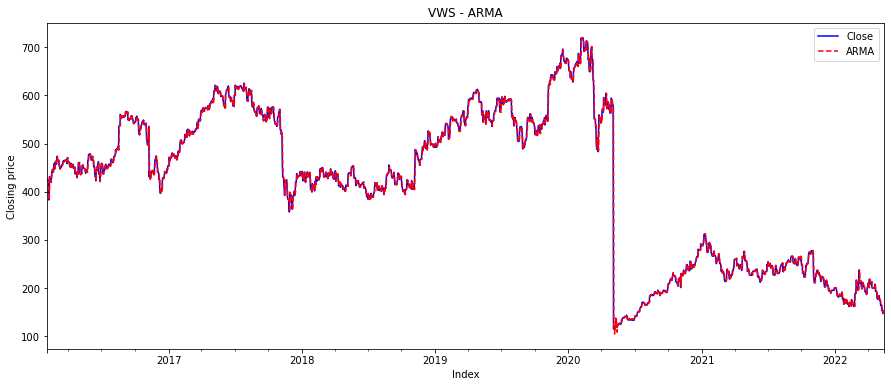

In [125]:
Plo.plot_models(VWS['Close'], VWS['ARMA'], 'VWS - ARMA')

##### Validating the Forecast

In [126]:
start = len(train_B)
end   = len(train_B) + len(test_B) - 1
predictions = arma_VWS.predict(start = start, end = end, dynamic = False, typ = 'levels')

In [127]:
# Create a dataframe to store r2 score
R_arma_VWS = pd.DataFrame({'r2_score': r2_score(test_B['Close'], predictions)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
R_arma_VWS['Model'] = 'ARMA'
R_arma_VWS.set_index(['Model'], inplace=True)
R_arma_VWS['mean_absolute_error'] = mean_absolute_error(test_B['Close'], predictions)
R_arma_VWS['mean_squared_error'] = mean_squared_error(test_B['Close'], predictions)
R_arma_VWS['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_B['Close'], predictions))
R_arma_VWS['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - test_B['Close'])
                                                               /np.abs(test_B['Close']))*100 
# Display the results
R_arma_VWS

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
ARMA,0.364202,20.276213,630.09357,25.101665,9.664659


### III.3.- ARIMA

#### A.- EDP Renováveis (0ML1.IL)

In [128]:
# Declare and initialise an object 'arima_obj' by calling a method 'ARIMA()'
arima_obj = ARIMA(EDPR['Close'].tolist(), order = (2, 0, 1))#best model by pmdarima.auto_arima
# Train the ARIMA model by calling a method fit()
arima_EDPR= arima_obj.fit(disp = 0)
# Display the summary of the trained model
arima_EDPR.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                 2325
Model:                     ARMA(2, 1)   Log Likelihood                 101.797
Method:                       css-mle   S.D. of innovations              0.231
Date:                Tue, 17 May 2022   AIC                           -193.595
Time:                        12:56:00   BIC                           -164.837
Sample:                             0   HQIC                          -183.116
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.6684      4.488      2.823      0.005       3.873      21.464
ar.L1.y        0.7245      0.153      4.740      0.000       0.425       1.024
ar.L2.y        0.2745      0.153      1.797      0.072      -0.025       0.574
ma.L1.y        0.3316      0.150      2.210      0.027       0.038       0.626
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0008           +0.0000j            1.0008            0.0000
AR.2           -3.6402           +0.0000j            3.6402            0.5000
MA.1           -3.0157           +0.0000j            3.0157            0.5000
-----------------------------------------------------------------------------
"""

In [129]:
# Declare the array 'pred' and append the values 
pred = arima_EDPR.fittedvalues.tolist()
#pred = np.append([0], arima_EDPR.fittedvalues.tolist())

In [130]:
# Add a new column 'ARIMA' into dataframe
EDPR['ARIMA'] = pred 

In [131]:
# Residues and fitted values are added and stored into dataframe

diffval = arima_EDPR.resid + arima_EDPR.fittedvalues

#diffval = np.append([0, 0],arima_EDPR.resid + arima_EDPR.fittedvalues)

In [132]:
EDPR['diffval']= diffval

In [133]:
# Display first five records
EDPR.tail()

,High,Low,Open,Close,Volume,Adj Close,WeekDay,Month,Year,Detrend,Differencing,Detrend_Diff,MA-RW,MA_EWM,MA_SES,MA_Holt-Winters,ARMA,ARIMA,diffval
Date,,,,,,,,,,,,,,,,,,,
2022-05-12,20.590000,19.940001,20.3475,20.120001,1814103.0,20.120001,Thursday,5,2022,-2.087884,-0.639999,-0.434163,21.770125,21.523764,21.671529,20.765742,20.757454,20.739150,20.120001
2022-05-13,20.411119,20.100000,20.1250,20.337500,187324.0,20.337500,Friday,5,2022,-1.701869,0.217499,0.386015,21.653000,21.410787,21.523764,20.125743,20.117533,20.083014,20.337500
2022-05-14,20.411119,20.100000,20.1250,20.337500,187324.0,20.337500,Friday,5,2022,-1.568708,0.000000,0.133161,21.535875,21.308569,21.410787,20.343242,20.335005,20.354619,20.337500
2022-05-15,20.411119,20.100000,20.1250,20.337500,187324.0,20.337500,Friday,5,2022,-1.454590,0.000000,0.114118,21.403000,21.216086,21.308569,20.343242,20.335005,20.324256,20.337500
2022-05-16,20.700001,20.240000,20.4800,20.480000,359647.0,20.480000,Monday,5,2022,-1.235775,0.142500,0.218815,21.289500,21.145983,21.216086,20.343242,20.335005,20.334325,20.480000


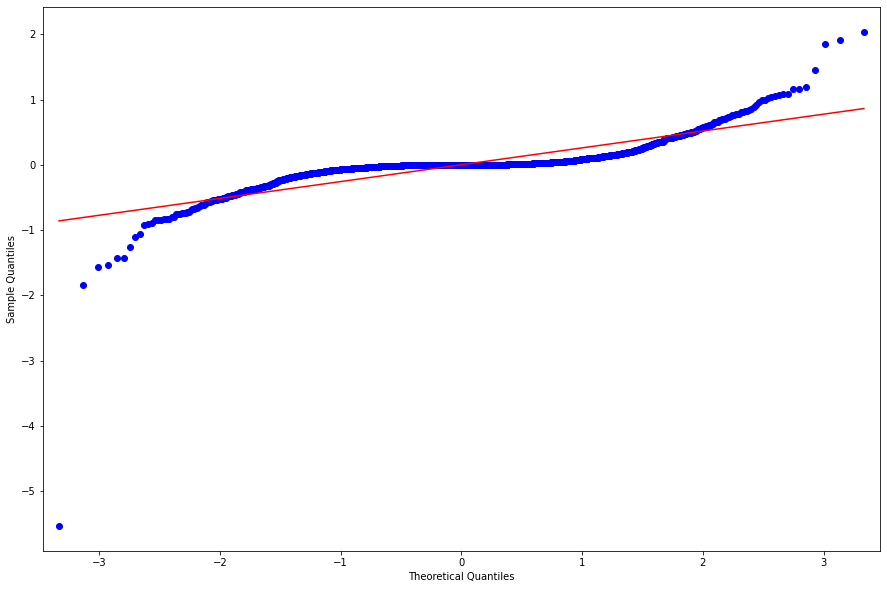

In [134]:
# Q-Q plot of the quantiles of x versus the quantiles/ppf of a distribution.
# Call qqplot() for arima_obj_fit
x = sm.qqplot(arima_EDPR.resid, line = 's')

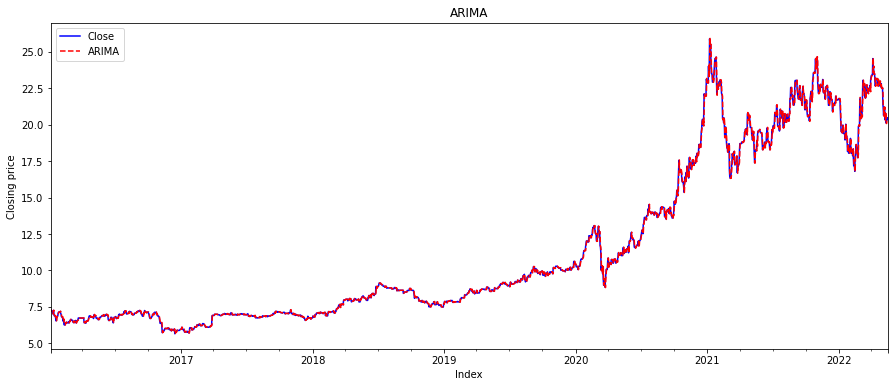

In [135]:
Plo.plot_models(EDPR['Close'], EDPR['ARIMA'], 'ARIMA')

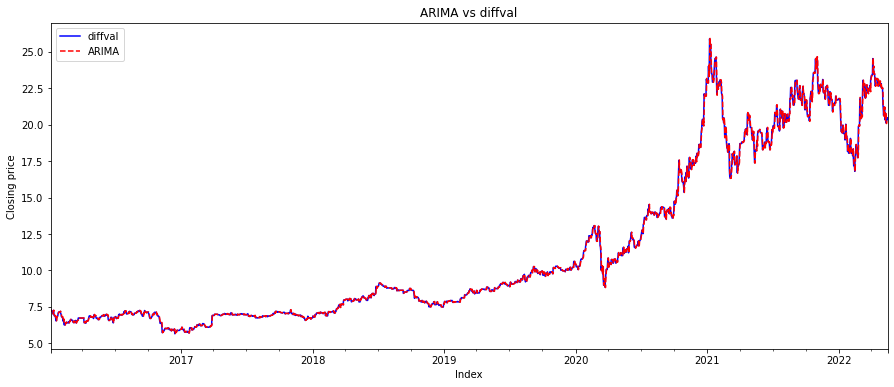

In [136]:
Plo.plot_models(EDPR['diffval'], EDPR['ARIMA'], 'ARIMA vs diffval')

Text(0, 0.5, 'Forecasted value')

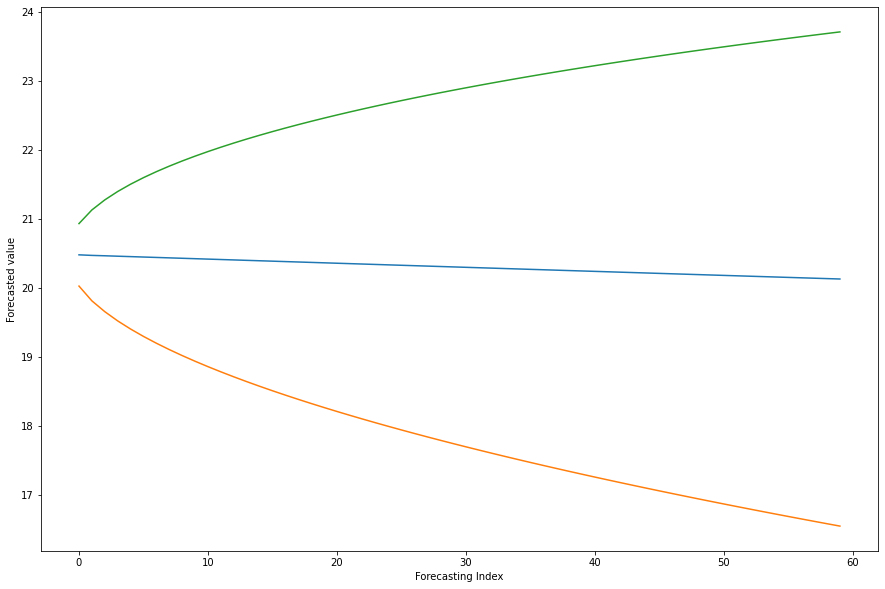

In [137]:
f, err, ci = arima_EDPR.forecast(60)
plt.plot(f)
plt.plot(ci)
plt.xlabel('Forecasting Index')
plt.ylabel('Forecasted value')
# The forecasting estimates and confidence interval obtained using the preceding script is shown in Figure

##### Validating the Forecast

In [138]:
start = len(train_A)
end   = len(train_A) + len(test_A) - 1
predictions = arima_EDPR.predict(start = start, end = end, dynamic = False, typ = 'levels')

In [139]:
# Create a dataframe to store r2 score
R_arima_EDPR = pd.DataFrame({'r2_score': r2_score(test_A['Close'], predictions)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
R_arima_EDPR ['Model'] = 'ARIMA'
R_arima_EDPR .set_index(['Model'], inplace=True)
R_arima_EDPR ['mean_absolute_error'] = mean_absolute_error(test_A['Close'], predictions)
R_arima_EDPR ['mean_squared_error'] = mean_squared_error(test_A['Close'], predictions)
R_arima_EDPR ['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_A['Close'], predictions))
R_arima_EDPR ['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - test_A['Close'])
                                                               /np.abs(test_A['Close']))*100 
# Display the results
R_arima_EDPR 

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
ARIMA,0.940403,0.266855,0.163911,0.404859,1.271175


#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [140]:
# Declare and initialise an object 'arima_obj' by calling a method 'ARIMA()'
arima_obj = ARIMA(VWS['Close'].tolist(), order = (1,0, 1))#(p,d,q)
#best model by pmdarima.auto_arima 0.1.0/0.01score
#by hand 1.0.1/ 0.11score
# Train the ARIMA model by calling a method fit()
arima_VWS= arima_obj.fit(disp = -1)
# Display the summary of the trained model
arima_VWS.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                              ARMA Model Results                              
==============================================================================
Dep. Variable:                      y   No. Observations:                 2295
Model:                     ARMA(1, 1)   Log Likelihood               -9042.271
Method:                       css-mle   S.D. of innovations             12.428
Date:                Tue, 17 May 2022   AIC                          18092.542
Time:                        12:56:02   BIC                          18115.496
Sample:                             0   HQIC                         18100.912
                                                                              
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const        387.7704     76.852      5.046      0.000     237.144     538.397
ar.L1.y        0.9970      0.002    643.844      0.000       0.994       1.000
ma.L1.y       -0.0006      0.021     -0.027      0.978      -0.042       0.041
                                    Roots                                    
=============================================================================
                  Real          Imaginary           Modulus         Frequency
-----------------------------------------------------------------------------
AR.1            1.0030           +0.0000j            1.0030            0.0000
MA.1         1735.3729           +0.0000j         1735.3729            0.0000
-----------------------------------------------------------------------------
"""

In [141]:
# Declare the array 'pred' and append the values 
#pred = np.append([0], arima_VWS.fittedvalues.tolist())
pred = arima_VWS.fittedvalues.tolist()

In [142]:
# Add a new column 'ARIMA' into dataframe
VWS['ARIMA'] = pred 

In [143]:
# Residues and fitted values are added and stored into dataframe
diffval = arima_VWS.resid + arima_VWS.fittedvalues
#diffval = np.append([0],arima_VWS.resid + arima_VWS.fittedvalues)

In [144]:
# Add a column 'diffval' into dataframe
VWS['diffval'] = diffval

In [145]:
# Display first five records
VWS.tail()

,High,Low,Open,Close,Volume,Adj Close,WeekDay,Month,Year,Detrend,Differencing,Detrend_Diff,MA-RW,MA_EWM,MA_SES,MA_Holt-Winters,ARMA,ARIMA,diffval
Date,,,,,,,,,,,,,,,,,,,
2022-05-12,151.639999,141.860001,151.440002,147.080002,1262426.0,147.080002,Thursday,5,2022,-2.045284,-8.149994,-0.268339,173.210501,170.976863,173.492323,154.971209,156.068379,155.927749,147.080002
2022-05-13,147.080002,147.080002,147.080002,147.080002,0.0,147.080002,Friday,5,2022,-1.854259,0.000000,0.191025,170.905502,168.700972,170.976863,146.874765,147.446345,147.808520,147.080002
2022-05-14,147.080002,147.080002,147.080002,147.080002,0.0,147.080002,Friday,5,2022,-1.698521,0.000000,0.155738,168.600502,166.641832,168.700972,146.834303,148.111074,147.803841,147.080002
2022-05-15,147.080002,147.080002,147.080002,147.080002,0.0,147.080002,Friday,5,2022,-1.567924,0.000000,0.130597,166.437002,164.778800,166.641832,146.834126,147.940702,147.803838,147.080002
2022-05-16,152.199997,146.360001,146.199997,149.149994,1116071.0,149.149994,Monday,5,2022,-1.359469,2.069992,0.208455,164.963502,163.290343,164.778800,146.834149,147.582466,147.803838,149.149994


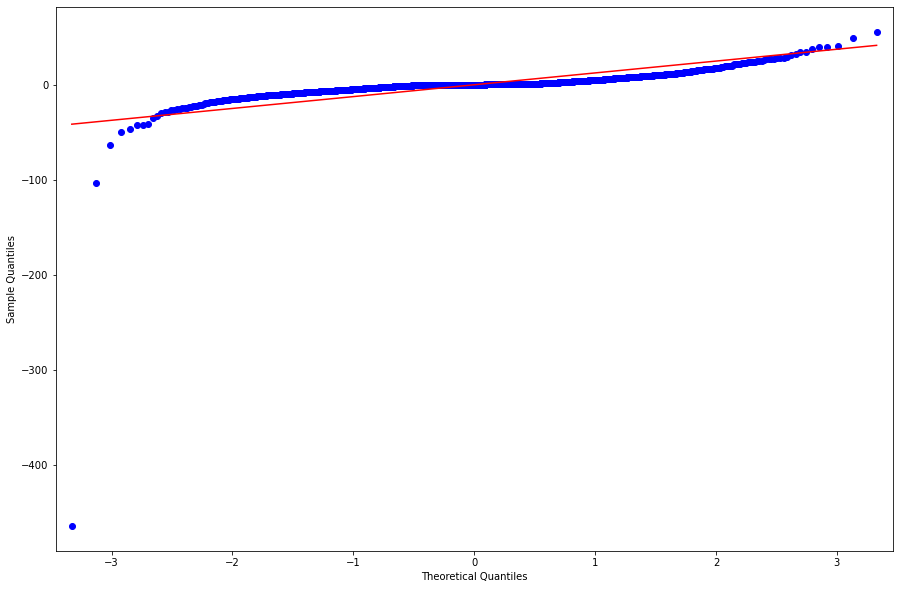

In [146]:
# Q-Q plot of the quantiles of x versus the quantiles/ppf of a distribution.
# Call qqplot() for arima_obj_fit
x = sm.qqplot(arima_VWS.resid, line = 's')

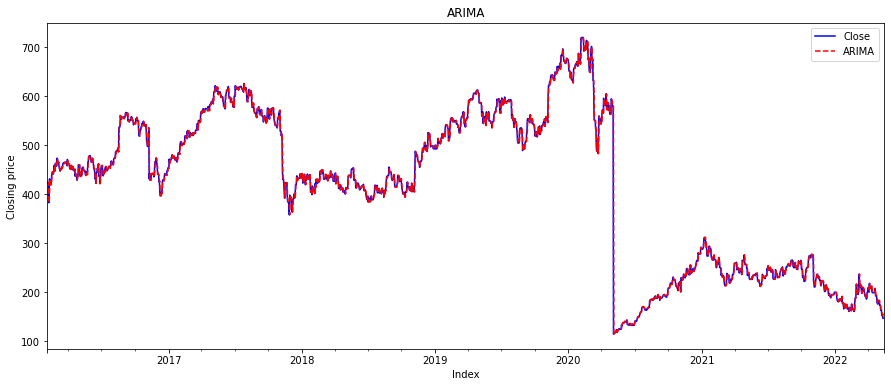

In [147]:
Plo.plot_models(VWS['Close'], VWS['ARIMA'], 'ARIMA')

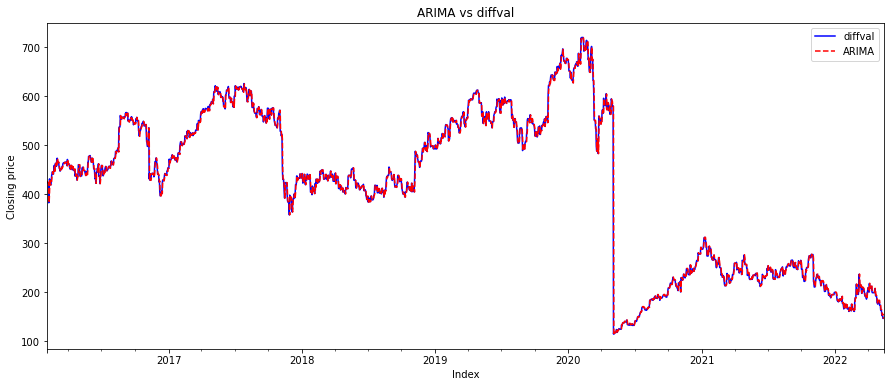

In [148]:
Plo.plot_models(VWS['diffval'], VWS['ARIMA'], 'ARIMA vs diffval')

Text(0, 0.5, 'Forecasted value')

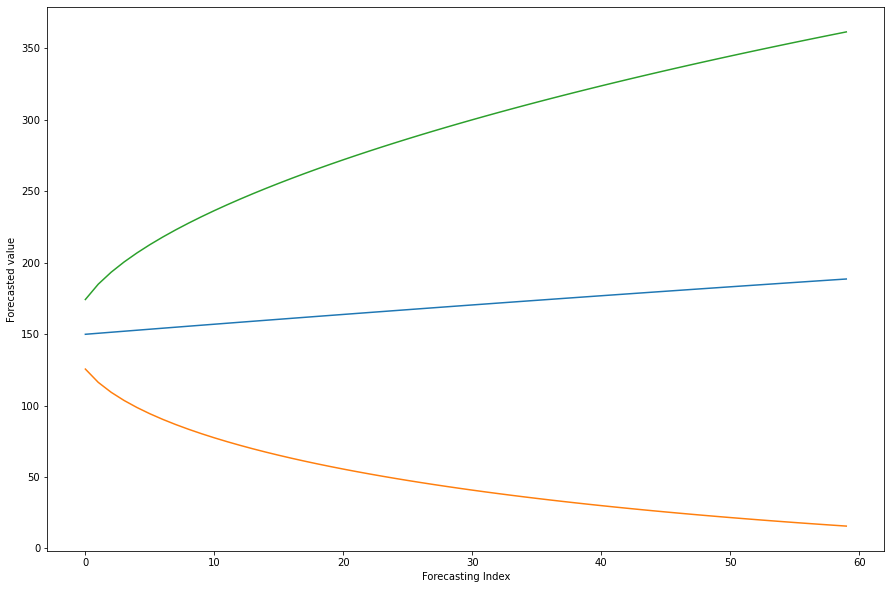

In [149]:
f, err, ci = arima_VWS.forecast(60)
plt.plot(f)
plt.plot(ci)
plt.xlabel('Forecasting Index')
plt.ylabel('Forecasted value')
# The forecasting estimates and confidence interval obtained using the preceding script is shown in Figure

##### Validating the Forecast

In [150]:
start = len(train_B)
end   = len(train_B) + len(test_B) - 1
predictions = arima_VWS.predict(start = start, end = end, dynamic = False, typ = 'levels')

In [151]:
# Create a dataframe to store r2 score
R_arima_VWS = pd.DataFrame({'r2_score': r2_score(test_B['Close'], predictions)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
R_arima_VWS['Model'] = 'ARIMA'
R_arima_VWS.set_index(['Model'], inplace=True)
R_arima_VWS['mean_absolute_error'] = mean_absolute_error(test_B['Close'], predictions)
R_arima_VWS['mean_squared_error'] = mean_squared_error(test_B['Close'], predictions)
R_arima_VWS['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_B['Close'], predictions))
R_arima_VWS['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - test_B['Close'])
                                                               /np.abs(test_B['Close']))*100 
# Display the results
R_arima_VWS

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
ARIMA,0.36368,20.284807,630.610618,25.111962,9.669949


### III.4.-SARIMA

#### A.- EDP Renováveis (0ML1.IL) 

In [152]:
# order = (2, 1, 2) means 
# First 2 for auto regressive model, 1 for difference, and second 2 for moving average
# 12 additional parameter means number of observations per year or the period
SARIMAX_EDPR = SARIMAX(EDPR['Close'], order = (2, 0, 2), seasonal_order = (2, 1, 0, 12)).fit()
#AutoSarima=3, 0, 2 **  2, 1, 0, 12 ***0.88 Score
#by hand=2, 0, 2 **  2, 0, 1, 12 *** 0.91 Score
# Display the summary of the model
print(SARIMAX_EDPR.summary())


                                      SARIMAX Results                                      
Dep. Variable:                               Close   No. Observations:                 2325
Model:             SARIMAX(2, 0, 2)x(2, 1, [], 12)   Log Likelihood                -179.339
Date:                             Tue, 17 May 2022   AIC                            372.678
Time:                                     12:56:07   BIC                            412.902
Sample:                                 01-04-2016   HQIC                           387.339
                                      - 05-16-2022                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3079      1.043      0.295      0.768      -1.736       2.352
ar.L2          0.6322      

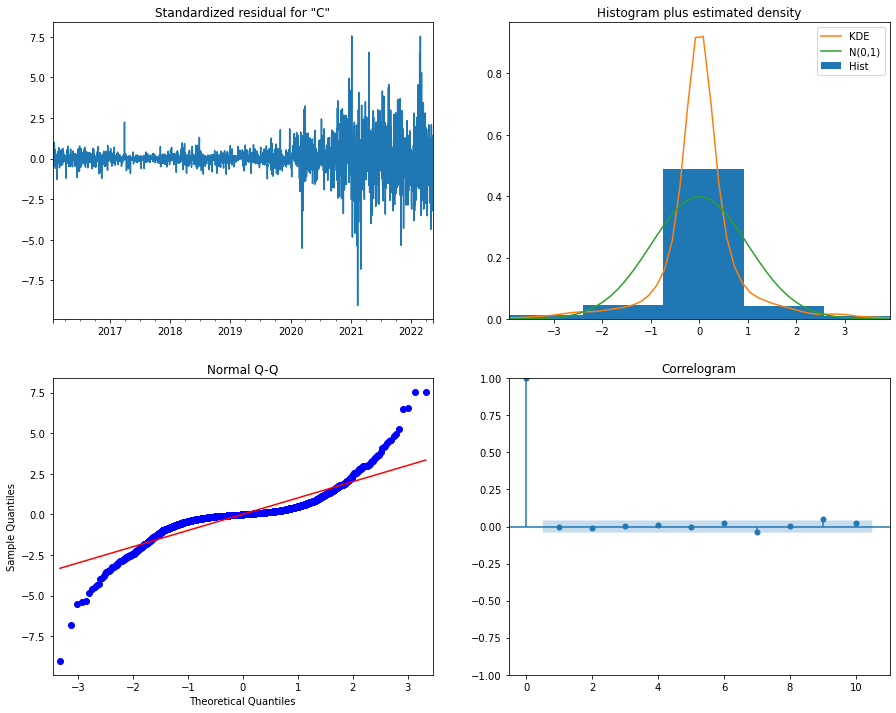

In [153]:
# Diagnosing the model residuals
SARIMAX_EDPR.plot_diagnostics(figsize = (15, 12))
plt.show()

##### Validating the Forecast

In [154]:
start = len(train_A)
end   = len(train_A) + len(test_A) - 1
predictions = SARIMAX_EDPR.predict(start = start, end = end, dynamic = False, typ = 'levels').rename('SARIMA Predictions')
print(predictions)

2021-06-02    19.539247
2021-06-03    18.497454
2021-06-04    17.960928
2021-06-05    18.336242
2021-06-06    18.765628
                ...    
2022-05-12    20.651863
2022-05-13    20.060949
2022-05-14    20.398845
2022-05-15    19.963155
2022-05-16    20.277208
Freq: D, Name: SARIMA Predictions, Length: 349, dtype: float64


In [155]:
# Create a dataframe to store r2 score
R_SARIMAX_EDPR = pd.DataFrame({'r2_score': r2_score(test_A['Close'], predictions)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
R_SARIMAX_EDPR['Model'] = 'SARIMA'
R_SARIMAX_EDPR.set_index(['Model'], inplace=True)
R_SARIMAX_EDPR['mean_absolute_error'] = mean_absolute_error(test_A['Close'], predictions)
R_SARIMAX_EDPR['mean_squared_error'] = mean_squared_error(test_A['Close'], predictions)
R_SARIMAX_EDPR['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_A['Close'], predictions))
R_SARIMAX_EDPR['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - test_A['Close'])
                                                               /np.abs(test_A['Close']))*100 
# Display the results
R_SARIMAX_EDPR

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
SARIMA,0.926709,0.335099,0.201573,0.448969,1.593656


#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [156]:
# 12 additional parameter means number of observations per year or the period
SARIMAX_VWS = SARIMAX(VWS['Close'], order = (0, 0,3),seasonal_order = (0, 1, 2, 12)).fit()#(AR,D,MA)#(p,d,q)
#AutoSarima=1, 0, 0 **  2, 1, 0, 12 ***	0.052546 Score
#by hand=0, 0, 3 **  0, 1, 2, 12 *** 0.34 Score
# Display the summary of the model
print(SARIMAX_VWS.summary())

                                        SARIMAX Results                                        
Dep. Variable:                                   Close   No. Observations:                 2295
Model:             SARIMAX(0, 0, 3)x(0, 1, [1, 2], 12)   Log Likelihood               -9990.256
Date:                                 Tue, 17 May 2022   AIC                          19992.511
Time:                                         12:56:14   BIC                          20026.911
Sample:                                     02-03-2016   HQIC                         20005.058
                                          - 05-16-2022                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          1.1108      0.006    197.272      0.000       1.100       1

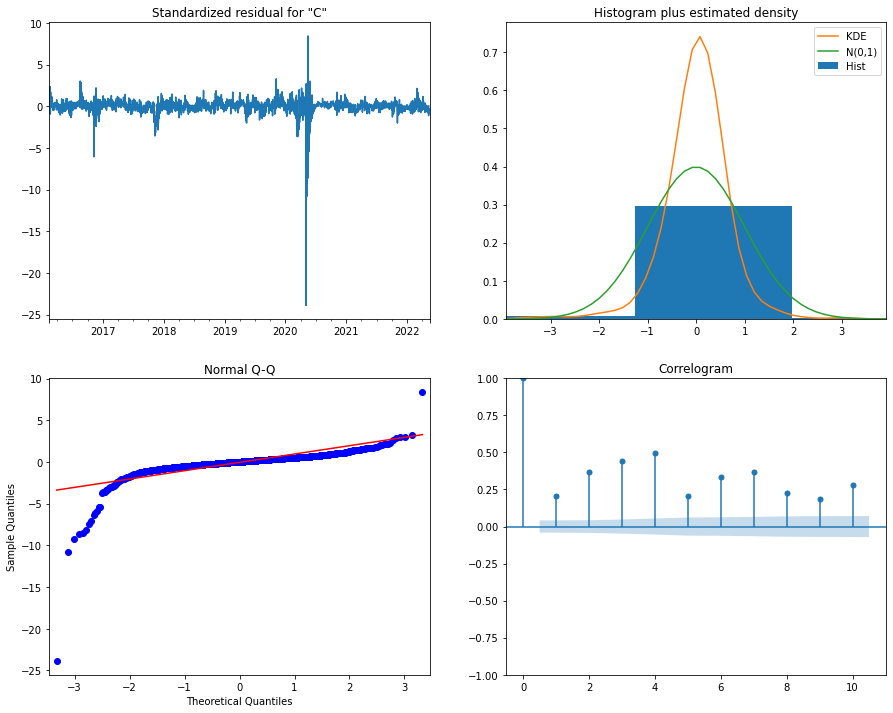

In [157]:
# Diagnosing the model residuals
SARIMAX_VWS.plot_diagnostics(figsize = (15, 12))
plt.show()

##### Validating the Forecast

In [158]:
start = len(train_B)
end   = len(train_B) + len(test_B) - 1
predictions = SARIMAX_VWS.predict(start = start, end = end, dynamic = False, typ = 'levels').rename('SARIMA Predictions')
print(predictions)

2021-07-02    250.172246
2021-07-03    234.163630
2021-07-04    244.804133
2021-07-05    236.589017
2021-07-06    246.715906
                 ...    
2022-06-11    168.649379
2022-06-12    172.727845
2022-06-13    173.112778
2022-06-14    167.035139
2022-06-15    165.036494
Freq: D, Name: SARIMA Predictions, Length: 349, dtype: float64


https://stats.stackexchange.com/questions/299712/what-are-the-shortcomings-of-the-mean-absolute-percentage-error-mape

In [159]:
# Create a dataframe to store r2 score
R_SARIMAX_VWS= pd.DataFrame({'r2_score': r2_score(test_B['Close'], predictions)}, index = [0])

# Add columns in the dataframe 'evaluation_results'
R_SARIMAX_VWS['Model'] = 'SARIMA'
R_SARIMAX_VWS.set_index(['Model'], inplace=True)
R_SARIMAX_VWS['mean_absolute_error'] = mean_absolute_error(test_B['Close'], predictions)
R_SARIMAX_VWS['mean_squared_error'] = mean_squared_error(test_B['Close'], predictions)
R_SARIMAX_VWS['root_mean_squared_error'] = np.sqrt(mean_squared_error(test_B['Close'], predictions))
R_SARIMAX_VWS['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - test_B['Close'])
                                                               /np.abs(test_B['Close']))*100
# Display the results
R_SARIMAX_VWS

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
SARIMA,0.505831,17.430067,489.734884,22.129954,3.27384


### III.5.-Keras

#### A.- EDP Renováveis (0ML1.IL) 

In [160]:
 """model = Sequential()
model.add(LSTM(units=50,return_sequences=True,input_shape=(train_A.shape[1], 1)))
model.add(Dropout(0.2))
model.add(LSTM(units=50,return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(units=50,return_sequences=True))
model.add(Dropout(0.2))
model.add(LSTM(units=50))
model.add(Dropout(0.2))
model.add(Dense(units=1))
model.compile(optimizer='adam',loss='mean_squared_error')
model.fit(train_A,train_A,epochs=100,batch_size=32)"""

"model = Sequential()\nmodel.add(LSTM(units=50,return_sequences=True,input_shape=(train_A.shape[1], 1)))\nmodel.add(Dropout(0.2))\nmodel.add(LSTM(units=50,return_sequences=True))\nmodel.add(Dropout(0.2))\nmodel.add(LSTM(units=50,return_sequences=True))\nmodel.add(Dropout(0.2))\nmodel.add(LSTM(units=50))\nmodel.add(Dropout(0.2))\nmodel.add(Dense(units=1))\nmodel.compile(optimizer='adam',loss='mean_squared_error')\nmodel.fit(train_A,train_A,epochs=100,batch_size=32)"

In [161]:
"""total = pd.concat((train_A['Close'], test_A['Close']), axis = 0)
inputs = total[len(total) - len(test_A) - 60:].values
inputs = inputs.reshape(-1,1)
X_test = []
for i in range(60, 76):
    X_test.append(inputs[i-60:i, 0])
    X_test = np.array(X_test)
    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))
    predicted_stock_price = model.predict(X_test)
    predicted_stock_price = sc.inverse_transform(predicted_stock_price)"""

"total = pd.concat((train_A['Close'], test_A['Close']), axis = 0)\ninputs = total[len(total) - len(test_A) - 60:].values\ninputs = inputs.reshape(-1,1)\nX_test = []\nfor i in range(60, 76):\n    X_test.append(inputs[i-60:i, 0])\n    X_test = np.array(X_test)\n    X_test = np.reshape(X_test, (X_test.shape[0], X_test.shape[1], 1))\n    predicted_stock_price = model.predict(X_test)\n    predicted_stock_price = sc.inverse_transform(predicted_stock_price)"

https://www.thepythoncode.com/article/stock-price-prediction-in-python-using-tensorflow-2-and-keras

#### B.- Vestas Wind Systems A/S (VWS.CO)

### III.6.-Facebook Prophet

#### A.- EDP Renováveis (0ML1.IL) 

In [162]:
dataset_EDP = pd.read_csv('EDPR_df.csv')

In [163]:
dataset_EDP = dataset_EDP[['Unnamed: 0', 'Close']].rename(columns = {'Unnamed: 0': 'ds', 'Close': 'y'})
dataset_EDP.head()

,ds,y
0,2016-01-04,7.13510
1,2016-01-05,7.30060
2,2016-01-06,7.21513
3,2016-01-07,7.21950
4,2016-01-08,7.19650


In [164]:
model = Prophet(daily_seasonality=True)
model.fit(dataset_EDP)

In [165]:
future_EDP = model.make_future_dataframe(periods=90) # With this line of code the model will make predictions for the next 90 days
preds_EDP = model.predict(future_EDP)

In [166]:
preds_EDP.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2016-01-04,7.077905,6.205605,8.817393,7.077905,7.077905,0.338848,0.338848,0.338848,-0.060092,...,-0.012942,-0.012942,-0.012942,0.411882,0.411882,0.411882,0.0,0.0,0.0,7.416753
1,2016-01-05,7.076262,6.137037,8.738968,7.076262,7.076262,0.345878,0.345878,0.345878,-0.060092,...,-0.004414,-0.004414,-0.004414,0.410385,0.410385,0.410385,0.0,0.0,0.0,7.422140
2,2016-01-06,7.074619,6.154382,8.742216,7.074619,7.074619,0.348164,0.348164,0.348164,-0.060092,...,0.002290,0.002290,0.002290,0.405966,0.405966,0.405966,0.0,0.0,0.0,7.422783
3,2016-01-07,7.072976,6.075477,8.683417,7.072976,7.072976,0.345281,0.345281,0.345281,-0.060092,...,0.006596,0.006596,0.006596,0.398777,0.398777,0.398777,0.0,0.0,0.0,7.418257
4,2016-01-08,7.071333,6.176677,8.625811,7.071333,7.071333,0.322355,0.322355,0.322355,-0.060092,...,-0.006553,-0.006553,-0.006553,0.389000,0.389000,0.389000,0.0,0.0,0.0,7.393688


In [167]:
preds_EDP.tail(90)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
1661,2022-05-17,21.810134,20.211794,22.614230,21.810134,21.810134,-0.474604,-0.474604,-0.474604,-0.060092,...,-0.004414,-0.004414,-0.004414,-0.410097,-0.410097,-0.410097,0.0,0.0,0.0,21.335531
1662,2022-05-18,21.813751,20.036244,22.660580,21.813751,21.813751,-0.450250,-0.450250,-0.450250,-0.060092,...,0.002290,0.002290,0.002290,-0.392448,-0.392448,-0.392448,0.0,0.0,0.0,21.363501
1663,2022-05-19,21.817368,20.078662,22.670337,21.817368,21.817368,-0.425925,-0.425925,-0.425925,-0.060092,...,0.006596,0.006596,0.006596,-0.372429,-0.372429,-0.372429,0.0,0.0,0.0,21.391443
1664,2022-05-20,21.820985,20.007154,22.640133,21.820985,21.820985,-0.417267,-0.417267,-0.417267,-0.060092,...,-0.006553,-0.006553,-0.006553,-0.350622,-0.350622,-0.350622,0.0,0.0,0.0,21.403717
1665,2022-05-21,21.824601,20.184724,22.777309,21.824601,21.824601,-0.380213,-0.380213,-0.380213,-0.060092,...,0.007512,0.007512,0.007512,-0.327632,-0.327632,-0.327632,0.0,0.0,0.0,21.444389
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1746,2022-08-10,22.117558,20.881591,23.462365,21.944033,22.273493,0.087910,0.087910,0.087910,-0.060092,...,0.002290,0.002290,0.002290,0.145712,0.145712,0.145712,0.0,0.0,0.0,22.205467
1747,2022-08-11,22.121175,20.901433,23.425585,21.942187,22.281806,0.095041,0.095041,0.095041,-0.060092,...,0.006596,0.006596,0.006596,0.148537,0.148537,0.148537,0.0,0.0,0.0,22.216215
1748,2022-08-12,22.124791,20.940649,23.603489,21.941873,22.296238,0.086278,0.086278,0.086278,-0.060092,...,-0.006553,-0.006553,-0.006553,0.152924,0.152924,0.152924,0.0,0.0,0.0,22.211069
1749,2022-08-13,22.128408,20.936186,23.619908,21.939443,22.304361,0.106284,0.106284,0.106284,-0.060092,...,0.007512,0.007512,0.007512,0.158865,0.158865,0.158865,0.0,0.0,0.0,22.234692


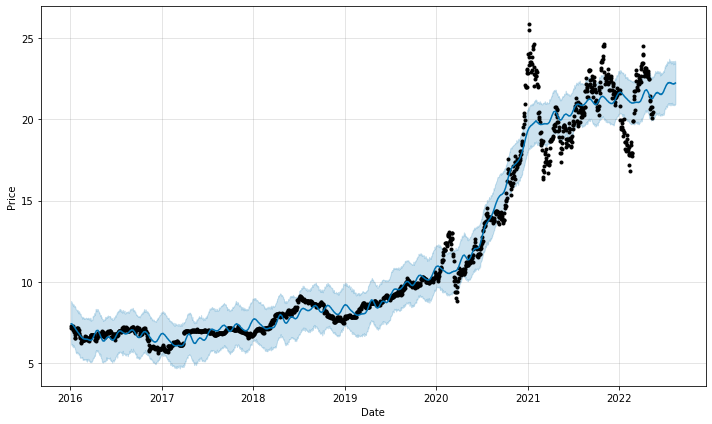

In [168]:
model.plot(preds_EDP, xlabel = 'Date', ylabel = 'Price');

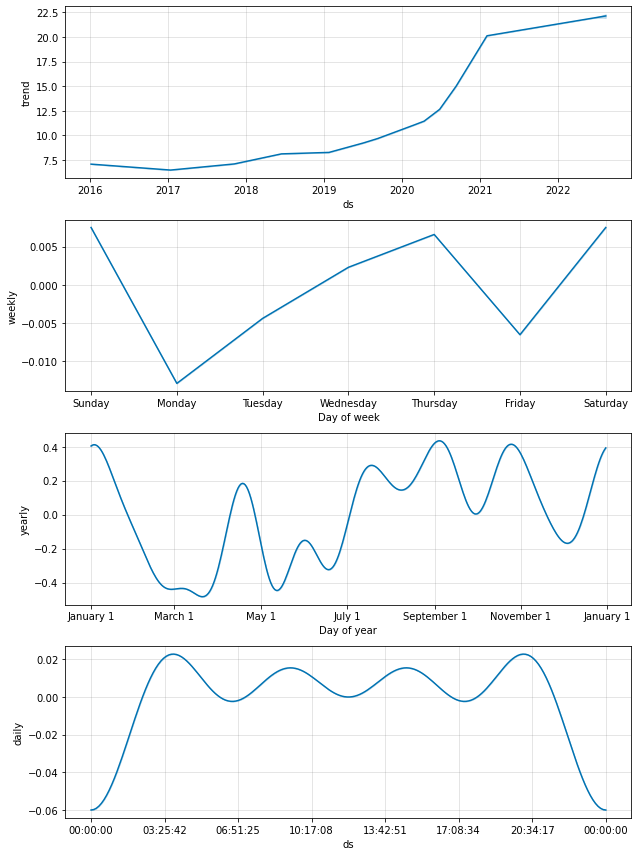

In [169]:
model.plot_components(preds_EDP);#shows the trend over the years, over one year and weekly 

In [170]:
from fbprophet.plot import plot_plotly, plot_components_plotly

In [171]:
plot_plotly(model, preds_EDP)

In [172]:
plot_components_plotly(model, preds_EDP)#shows the trend over the years, over one year and weekly 

##### Validating the Forecast

In [173]:
EDPR.info

<bound method DataFrame.info of                  High        Low      Open      Close     Volume  Adj Close  \
Date                                                                          
2016-01-04   7.135100   7.135100   7.13510   7.135100        0.0   6.866566   
2016-01-05   7.300600   7.300600   7.30060   7.300600      150.0   7.025838   
2016-01-06   7.215130   7.136500   7.22580   7.215130     1331.0   6.943585   
2016-01-07   7.234500   7.125000   7.17600   7.219500    11142.0   6.947790   
2016-01-08   7.279000   7.196500   7.24165   7.196500    13085.0   6.925655   
...               ...        ...       ...        ...        ...        ...   
2022-05-12  20.590000  19.940001  20.34750  20.120001  1814103.0  20.120001   
2022-05-13  20.411119  20.100000  20.12500  20.337500   187324.0  20.337500   
2022-05-14  20.411119  20.100000  20.12500  20.337500   187324.0  20.337500   
2022-05-15  20.411119  20.100000  20.12500  20.337500   187324.0  20.337500   
2022-05-16  20.70000

In [174]:
dataset_EDP.info

<bound method DataFrame.info of               ds          y
0     2016-01-04   7.135100
1     2016-01-05   7.300600
2     2016-01-06   7.215130
3     2016-01-07   7.219500
4     2016-01-08   7.196500
...          ...        ...
1656  2022-05-10  20.785000
1657  2022-05-11  20.760000
1658  2022-05-12  20.120001
1659  2022-05-13  20.337500
1660  2022-05-16  20.480000

[1661 rows x 2 columns]>

In [175]:
'''
# Python
cutoffs = pd.to_datetime(['2017-02-15', '2019-08-15', '2021-02-15'])
df_cv2 = cross_validation(preds_EDP,cutoffs=cutoffs, horizon='365 days')


df_p = performance_metrics(EDPR)
df_p.head()'''

"\n# Python\ncutoffs = pd.to_datetime(['2017-02-15', '2019-08-15', '2021-02-15'])\ndf_cv2 = cross_validation(preds_EDP,cutoffs=cutoffs, horizon='365 days')\n\n\ndf_p = performance_metrics(EDPR)\ndf_p.head()"

#### B.- Vestas Wind Systems A/S (0NMK.IL)

In [176]:
dataset_VWS = pd.read_csv('VWS_df.csv')

In [177]:
dataset_VWS = dataset_VWS[['Unnamed: 0', 'Close']].rename(columns = {'Unnamed: 0': 'ds', 'Close': 'y'})
dataset_VWS

,ds,y
0,2016-01-04,475.468903
1,2016-01-05,475.200012
2,2016-01-06,468.399994
3,2016-01-07,460.307312
4,2016-01-08,458.308014
...,...,...
1656,2022-05-10,152.490005
1657,2022-05-11,155.229996
1658,2022-05-12,147.080002
1659,2022-05-13,147.080002


In [178]:
model = Prophet(daily_seasonality=True)
model.fit(dataset_VWS)

In [179]:
future_VWS = model.make_future_dataframe(periods=90) # With this line of code the model will make predictions for the next 90 days
preds_VWS = model.predict(future_VWS)

In [180]:
preds_VWS.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2016-01-04,447.585935,360.083681,475.706173,447.585935,447.585935,-27.029648,-27.029648,-27.029648,-24.353033,...,-2.057829,-2.057829,-2.057829,-0.618786,-0.618786,-0.618786,0.0,0.0,0.0,420.556287
1,2016-01-05,447.852128,364.084487,480.288635,447.852128,447.852128,-25.550844,-25.550844,-25.550844,-24.353033,...,-0.888079,-0.888079,-0.888079,-0.309732,-0.309732,-0.309732,0.0,0.0,0.0,422.301284
2,2016-01-06,448.118322,366.274077,482.417146,448.118322,448.118322,-25.380121,-25.380121,-25.380121,-24.353033,...,-0.938016,-0.938016,-0.938016,-0.089072,-0.089072,-0.089072,0.0,0.0,0.0,422.738201
3,2016-01-07,448.384515,366.739325,483.014445,448.384515,448.384515,-25.436102,-25.436102,-25.436102,-24.353033,...,-1.124400,-1.124400,-1.124400,0.041331,0.041331,0.041331,0.0,0.0,0.0,422.948413
4,2016-01-08,448.650708,363.220698,480.461889,448.650708,448.650708,-25.351673,-25.351673,-25.351673,-24.353033,...,-1.079934,-1.079934,-1.079934,0.081294,0.081294,0.081294,0.0,0.0,0.0,423.299036


In [181]:
preds_VWS.tail(90)

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
1661,2022-05-17,211.251728,96.844171,218.819520,211.251728,211.251728,-52.540512,-52.540512,-52.540512,-24.353033,...,-0.888079,-0.888079,-0.888079,-27.299400,-27.299400,-27.299400,0.0,0.0,0.0,158.711216
1662,2022-05-18,211.106953,100.459708,219.550080,211.106953,211.106953,-53.002333,-53.002333,-53.002333,-24.353033,...,-0.938016,-0.938016,-0.938016,-27.711284,-27.711284,-27.711284,0.0,0.0,0.0,158.104620
1663,2022-05-19,210.962178,99.887028,220.558558,210.962178,210.962178,-53.327641,-53.327641,-53.327641,-24.353033,...,-1.124400,-1.124400,-1.124400,-27.850209,-27.850209,-27.850209,0.0,0.0,0.0,157.634537
1664,2022-05-20,210.817403,102.665277,215.607400,210.817403,210.817403,-53.169103,-53.169103,-53.169103,-24.353033,...,-1.079934,-1.079934,-1.079934,-27.736136,-27.736136,-27.736136,0.0,0.0,0.0,157.648300
1665,2022-05-21,210.672628,101.028427,222.577624,210.672628,210.672628,-48.701341,-48.701341,-48.701341,-24.353033,...,3.044129,3.044129,3.044129,-27.392438,-27.392438,-27.392438,0.0,0.0,0.0,161.971287
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1746,2022-08-10,198.945860,104.348307,233.960291,179.962798,223.478715,-30.640500,-30.640500,-30.640500,-24.353033,...,-0.938016,-0.938016,-0.938016,-5.349451,-5.349451,-5.349451,0.0,0.0,0.0,168.305361
1747,2022-08-11,198.801086,102.335615,233.460104,179.527983,223.736632,-30.435860,-30.435860,-30.435860,-24.353033,...,-1.124400,-1.124400,-1.124400,-4.958428,-4.958428,-4.958428,0.0,0.0,0.0,168.365225
1748,2022-08-12,198.656311,104.298363,233.141859,179.150488,223.966614,-29.967245,-29.967245,-29.967245,-24.353033,...,-1.079934,-1.079934,-1.079934,-4.534278,-4.534278,-4.534278,0.0,0.0,0.0,168.689066
1749,2022-08-13,198.511536,103.829625,241.327386,178.480868,224.578650,-25.392923,-25.392923,-25.392923,-24.353033,...,3.044129,3.044129,3.044129,-4.084020,-4.084020,-4.084020,0.0,0.0,0.0,173.118612


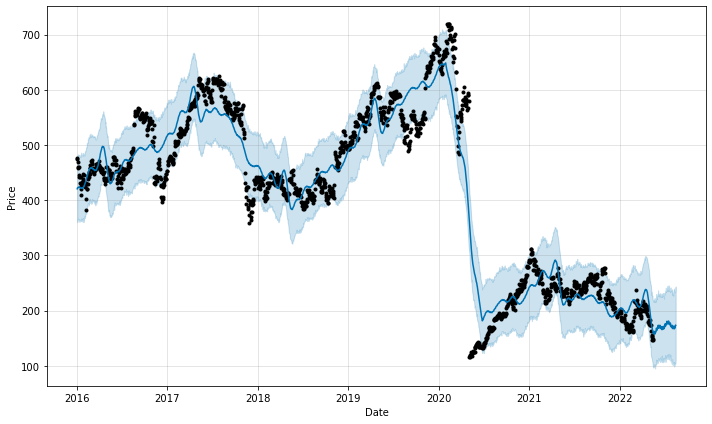

In [182]:
model.plot(preds_VWS, xlabel = 'Date', ylabel = 'Price');

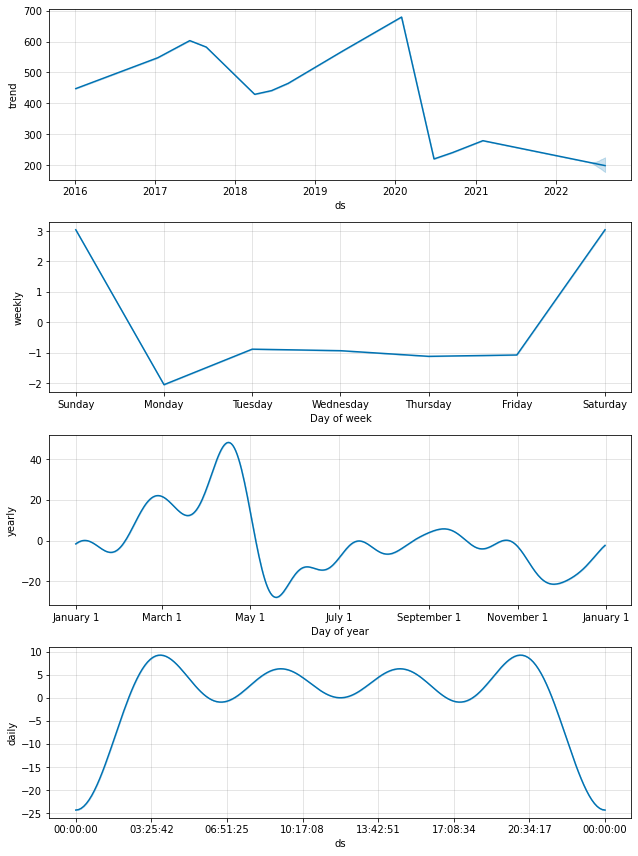

In [183]:
model.plot_components(preds_VWS);#shows the trend over the years, over one year and weekly 

In [184]:
plot_plotly(model, preds_VWS)

## Summary

In [185]:
Validation_EDPR= pd.concat([MA_SES_EDPR, MA_HoltWinters_EDPR,R_arma_EDPR,R_arima_EDPR,R_SARIMAX_EDPR])
Validation_EDPR

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
MA_SES,0.940186,0.262708,0.164509,0.405597,1.251983
MA_Holt-Winters,0.940913,0.265158,0.162509,0.403124,1.264101
ARMA,0.940185,0.263461,0.164511,0.405600,1.255450
ARIMA,0.940403,0.266855,0.163911,0.404859,1.271175
SARIMA,0.926709,0.335099,0.201573,0.448969,1.593656


In [186]:
Validation_VWS= pd.concat([MA_SES_VWS, MA_HoltWinters_VWS,R_arma_VWS,R_arima_VWS,R_SARIMAX_VWS])
Validation_VWS

,r2_score,mean_absolute_error,mean_squared_error,root_mean_squared_error,mean_absolute_percentage_error
Model,,,,,
MA_SES,0.955942,4.495328,43.662503,6.607761,2.097265
MA_Holt-Winters,0.955942,4.495328,43.662503,6.607761,2.097265
ARMA,0.364202,20.276213,630.093570,25.101665,9.664659
ARIMA,0.363680,20.284807,630.610618,25.111962,9.669949
SARIMA,0.505831,17.430067,489.734884,22.129954,3.273840


## Complementary Reading

Reference: Efstathopoulos g. (2020) Python for Finance, Part I: Yahoo & Google Finance API, pandas, and matplotlib 
Available at: URL <a href="https://www.learndatasci.com/tutorials/python-finance-part-yahoo-finance-api-pandas-matplotlib/ ">https://www.learndatasci.com/tutorials/python-finance-part-yahoo-finance-api-pandas-matplotlib/ </a>(Accessed 14 October 2021).  

Reference: Witham, J. (2020) The Imperative For A 24/7 Renewable Energy World, Forbes. 
Available at: URL <a href="https://pandas-datareader.readthedocs.io/en/latest/remote_data.html#remote-data-yahoo">https://pandas-datareader.readthedocs.io/en/latest/remote_data.html#remote-data-yahoo/ </a>(Accessed 14 October 2021).  

Reference: Norris, E. (2021) "Why Did My Stock's Ticker Change?", Investopedia. 
Available at: URL <a href="https://www.investopedia.com/ask/answers/why-did-my-stocks-ticker-change/">https://www.investopedia.com/ask/answers/why-did-my-stocks-ticker-change/ </a>(Accessed 14 October 2021).  

Reference: Mahgoub, A. (2021) "Stock Prediction using Regression Algorithm in Python", Medium. 
Available at: URL <a href="https://medium.com/codex/stock-predication-using-regression-algorithm-in-python-fb8b426453b9/">https://medium.com/codex/stock-predication-using-regression-algorithm-in-python-fb8b426453b9</a>(Accessed 25 Feb 2022). 

Reference: Prabhakaran, S. (2019) "Augmented Dickey Fuller Test (ADF Test) – Must Read Guide", Medium. 
Available at: URL <a href="https://www.machinelearningplus.com/time-series/augmented-dickey-fuller-test/#:~:text=Augmented%20Dickey%20Fuller%20test%20(ADF%20Test)%20is%20a%20common%20statistical,the%20stationary%20of%20a%20series.">https://www.machinelearningplus.com/time-series/augmented-dickey-fuller-test/#:~:text=Augmented%20Dickey%20Fuller%20test%20(ADF%20Test)%20is%20a%20common%20statistical,the%20stationary%20of%20a%20series.</a>

Reference: Masum, M. (2020) "Time Series Analysis: Identifying AR and MA using ACF and PACF Plots", Medium. 
Available at: URL <a href="https://towardsdatascience.com/identifying-ar-and-ma-terms-using-acf-and-pacf-plots-in-time-series-forecasting-ccb9fd073db8">https://towardsdatascience.com/identifying-ar-and-ma-terms-using-acf-and-pacf-plots-in-time-series-forecasting-ccb9fd073db8</a> (Accessed 21 March 2022).  

Reference: Zvornicanin E. (2021) "Choosing the best q and p from ACF and PACF plots in ARMA-type modeling", Baeldung. 
Available at: URL <a href="https://www.baeldung.com/cs/acf-pacf-plots-arma-modeling">https://www.baeldung.com/cs/acf-pacf-plots-arma-modeling</a> (Accessed 21 March 2022). 


Reference: Prabhakaran S. (2021) "ARIMA Model – Complete Guide to Time Series Forecasting in Python", Machinelearningplus. 
Available at: URL <a href="https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/">https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/</a> (Accessed 21 March 2022). 

Reference: Daitan (2019) "A Visual Guide to Time Series Decomposition Analysis", Betterprogramming 
Available at: URL <a href="https://betterprogramming.pub/a-visual-guide-to-time-series-decomposition-analysis-a1472bb9c930">https://betterprogramming.pub/a-visual-guide-to-time-series-decomposition-analysis-a1472bb9c930</a> (Accessed 14 April 2022).

Reference: Zach (2021) "Augmented Dickey-Fuller Test in Python (With Example)", Statology.org 
Available at: URL <a href="https://www.statology.org/dickey-fuller-test-python/">https://www.statology.org/dickey-fuller-test-python/</a> (Accessed 14 April 2022).

Reference: Shao, V.(2020) "Forecasting with a Time Series Model using Python: Part One", Bounteous
Available at: URL <a href="https://www.bounteous.com/insights/2020/09/15/forecasting-time-series-model-using-python-part-one/">https://www.bounteous.com/insights/2020/09/15/forecasting-time-series-model-using-python-part-one/</a> (Accessed 15 April 2022).
